# 03. Train

This notebook trains the first Mask R-CNN baseline for the TACO dataset. It starts from a COCO-pretrained model, replaces the classification and mask heads for the current number of TACO classes, verifies the data format, checks that the model can overfit small subsets, and then runs full-dataset training in two stages.

The goal of this notebook is not to solve all dataset issues yet. It provides a reproducible baseline and surfaces the first training limitations that are investigated in later experiment notebooks.


## Load data

The dataset archive and processed annotation table are loaded from Google Drive. The processed annotation table was created in the data-loading notebook and contains one row per annotated object.


In [1]:
!gdown 1CUxA2TcZFhVJWvNH4qwlOSGDPlxodRPF
!unzip taco.zip -d /content

Downloading...
From (original): https://drive.google.com/uc?id=1CUxA2TcZFhVJWvNH4qwlOSGDPlxodRPF
From (redirected): https://drive.google.com/uc?id=1CUxA2TcZFhVJWvNH4qwlOSGDPlxodRPF&confirm=t&uuid=c702d002-745e-422c-bc26-6856771d3e3b
To: /content/taco.zip
100% 5.23G/5.23G [01:12<00:00, 71.8MB/s]
Archive:  taco.zip
   creating: /content/content/drive/MyDrive/taco_dataset/taco/
  inflating: /content/content/drive/MyDrive/taco_dataset/taco/annotations.json  
   creating: /content/content/drive/MyDrive/taco_dataset/taco/batch_14/
  inflating: /content/content/drive/MyDrive/taco_dataset/taco/batch_14/000011.jpg  
  inflating: /content/content/drive/MyDrive/taco_dataset/taco/batch_14/000007.jpg  
  inflating: /content/content/drive/MyDrive/taco_dataset/taco/batch_14/000004.jpg  
  inflating: /content/content/drive/MyDrive/taco_dataset/taco/batch_14/000000.jpg  
  inflating: /content/content/drive/MyDrive/taco_dataset/taco/batch_14/000014.jpg  
  inflating: /content/content/drive/MyDrive/taco_

In [2]:
!gdown 1lj6H8pIbHjgrgNRWHoc41Nr8bi0FZ7mt # annotations_processed.csv

Downloading...
From: https://drive.google.com/uc?id=1lj6H8pIbHjgrgNRWHoc41Nr8bi0FZ7mt
To: /content/annotations_processed.csv
100% 3.10M/3.10M [00:00<00:00, 255MB/s]


## Install Packages

In [3]:
!pip install torchmetrics pycocotools

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.4/983.4 kB 4.2 MB/s eta 0:00:00a 0:00:01


## Import packages

In [4]:
import os
import ast
import json
import math
import random
from collections.abc import Callable, Sequence
from typing import Any

import numpy as np
import pandas as pd
import torch
import torchvision
from matplotlib import colors, pyplot as plt
from PIL import Image, ImageDraw
from torch.utils.data import DataLoader, Dataset, Subset, WeightedRandomSampler, random_split
from torch.utils.tensorboard import SummaryWriter
from torchvision.io import read_image
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
from tqdm import tqdm

%matplotlib inline


The notebook is designed to run both in Google Colab and on a remote GPU instance. These path constants keep the rest of the notebook independent of the execution environment.


## Set Environment Paths

In [5]:
def is_google_colab() -> bool:
    """Return True when the notebook is executed inside Google Colab."""
    try:
        import google.colab
        return True
    except ImportError:
        return False


IN_COLAB = is_google_colab()

if IN_COLAB:
    ROOT_PATH = "/content"
    DATAFRAME_PATH = "/content/drive/MyDrive/taco_trash"
    DEFAULT_RUNS_PATH = "/content/drive/MyDrive/taco_trash"
else:
    ROOT_PATH = "/home/ubuntu"
    DATAFRAME_PATH = os.path.join(ROOT_PATH, "taco_trash")
    DEFAULT_RUNS_PATH = os.path.join(ROOT_PATH, "taco_trash")

TACO_CLASSIFICATION_PATH = os.path.join(ROOT_PATH, "taco")


In [6]:
if is_google_colab():
    from google.colab import drive
    drive.mount("/content/drive")

Mounted at /content/drive


The random seeds are fixed to make dataset splitting, subset selection, and early experiments easier to reproduce. Exact GPU reproducibility is still not guaranteed, but the main experiment setup becomes stable.


## Configure environment

In [7]:
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

In [ ]:
torch.cuda.current_device()
torch.cuda.get_device_name(0)
device = torch.device("cuda")
device

In [8]:
df = pd.read_csv(os.path.join(ROOT_PATH, "annotations_processed.csv"))

Torchvision detection models expect each sample as an image tensor and a target dictionary. Because the TACO dataframe is object-level, the dataset class groups rows by `image_id` and returns all objects for one image at once.

The target dictionary contains:

- `boxes`: bounding boxes in `[x1, y1, x2, y2]` format;
- `labels`: contiguous class ids, where 0 is reserved for background;
- `masks`: binary instance masks with shape `[N, H, W]`.


## Dataset

In [6]:
def polygons_to_masks(
    segmentation: Sequence[Sequence[float]],
    height: int,
    width: int,
) -> torch.Tensor:
    """Convert COCO polygon segmentation into binary instance masks.

    Args:
        segmentation: List of polygons. Each polygon is a flat coordinate list in
            COCO format: ``[x1, y1, x2, y2, ...]``.
        height: Image height in pixels.
        width: Image width in pixels.

    Returns:
        Tensor of shape ``[N, H, W]`` with one binary mask per polygon. If no
        polygons are available, returns an empty tensor with shape ``[0, H, W]``.
    """
    masks: list[torch.Tensor] = []

    for seg in segmentation:
        mask = Image.new("L", (width, height), 0)
        draw = ImageDraw.Draw(mask)

        polygon = [(seg[i], seg[i + 1]) for i in range(0, len(seg), 2)]
        draw.polygon(polygon, outline=1, fill=1)

        masks.append(torch.from_numpy(np.array(mask, dtype=np.uint8)))

    if len(masks) > 0:
        return torch.stack(masks)

    return torch.zeros((0, height, width), dtype=torch.uint8)


class TacoDataset(Dataset):
    """PyTorch dataset that converts the object-level TACO dataframe to Mask R-CNN targets.

    Each dataframe row represents one annotated object. The dataset groups rows by
    ``image_id`` so that every returned sample contains one image and all of its
    boxes, labels, and masks.
    """

    def __init__(self, df: pd.DataFrame, label_map: dict[int, int]) -> None:
        """Initialize dataset from the processed annotation dataframe.

        Args:
            df: Object-level dataframe with image metadata, bounding boxes,
                segmentations, and category ids.
            label_map: Mapping from original TACO ``category_id`` values to
                contiguous model label ids. Label id 0 is reserved for background.
        """
        self.image_groups = list(df.groupby("image_id"))
        self.label_map = label_map

    def __getitem__(self, idx: int) -> tuple[torch.Tensor, dict[str, torch.Tensor]]:
        """Return one image and its Mask R-CNN target dictionary."""
        image_id, group = self.image_groups[idx]
        file_path = group.iloc[0]["file_path"]

        img = read_image(file_path).float() / 255.0
        _, H, W = img.shape

        boxes: list[list[float]] = []
        labels: list[int] = []
        masks: list[torch.Tensor] = []

        for _, row in group.iterrows():
            bbox = ast.literal_eval(row["bbox"]) if isinstance(row["bbox"], str) else row["bbox"]
            x, y, w, h = bbox
            boxes.append([x, y, x + w, y + h])

            segmentation = (
                ast.literal_eval(row["segmentation"])
                if isinstance(row["segmentation"], str)
                else row["segmentation"]
            )
            mask = polygons_to_masks(segmentation, H, W)
            masks.append(mask.sum(dim=0).clamp(max=1).to(torch.uint8))
            labels.append(self.label_map[row["category_id"]])

        target = {
            "boxes": torch.tensor(boxes, dtype=torch.float32),
            "labels": torch.tensor(labels, dtype=torch.int64),
            "masks": torch.stack(masks),
        }
        return img, target

    def __len__(self) -> int:
        """Return the number of unique images in the dataset."""
        return len(self.image_groups)


### Test

In [11]:
cat_ids = sorted(df["category_id"].unique())
label_map = {cat_id: i + 1 for i, cat_id in enumerate(cat_ids)}
num_classes = len(label_map) + 1
dataset = TacoDataset(df=df, label_map=label_map)
img, target = dataset[1]
img

tensor([[[0.9686, 0.9725, 0.9765,  ..., 0.4549, 0.4510, 0.4471],
         [0.9725, 0.9725, 0.9765,  ..., 0.4471, 0.4510, 0.4431],
         [0.9765, 0.9765, 0.9804,  ..., 0.4471, 0.4549, 0.4588],
         ...,
         [0.7059, 0.7020, 0.6980,  ..., 0.4157, 0.4235, 0.4235],
         [0.7137, 0.7059, 0.7020,  ..., 0.4118, 0.4118, 0.4078],
         [0.7255, 0.7137, 0.7020,  ..., 0.4157, 0.3922, 0.4000]],

        [[0.9686, 0.9725, 0.9765,  ..., 0.2706, 0.2667, 0.2588],
         [0.9725, 0.9725, 0.9765,  ..., 0.2627, 0.2667, 0.2549],
         [0.9765, 0.9765, 0.9804,  ..., 0.2627, 0.2706, 0.2706],
         ...,
         [0.5373, 0.5333, 0.5294,  ..., 0.2314, 0.2392, 0.2471],
         [0.5451, 0.5373, 0.5333,  ..., 0.2275, 0.2353, 0.2392],
         [0.5647, 0.5529, 0.5373,  ..., 0.2353, 0.2196, 0.2275]],

        [[0.9608, 0.9647, 0.9686,  ..., 0.0980, 0.0863, 0.0706],
         [0.9647, 0.9647, 0.9686,  ..., 0.0902, 0.0863, 0.0667],
         [0.9686, 0.9686, 0.9725,  ..., 0.0902, 0.0902, 0.

In [12]:
target['boxes']

tensor([[1.0000e+00, 4.5700e+02, 1.4300e+03, 1.9760e+03],
        [5.3100e+02, 2.9200e+02, 1.5370e+03, 9.6400e+02]])

In [13]:
target['labels']

tensor([19, 15])

In [14]:
target['masks']

tensor([[[0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         ...,
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0]],

        [[0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         ...,
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0]]], dtype=torch.uint8)

The dataloader uses a custom `collate_fn` because every image can contain a different number of objects. The training loader also uses `WeightedRandomSampler` to reduce the effect of class imbalance.


## Dataloader

Detection and segmentation models cannot use the default PyTorch batching logic directly, because each image can contain a different number of objects. For example, one image may have one annotated object, while another image may have dozens of objects. Therefore, the number of bounding boxes, labels, and masks is different for each sample.

To handle this, a custom `collate_fn` is used. It keeps images and targets as tuples instead of trying to stack all targets into one tensor.

The training dataloader uses a weighted sampler to reduce the effect of class imbalance. The validation dataloader does not use sampling or shuffling, because validation should reflect the original data distribution and remain deterministic.

In [15]:
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size

train_dataset, val_dataset = random_split(
    dataset,
    [train_size, val_size],
    generator=torch.Generator().manual_seed(42)
)

In [16]:
train_dataset.indices

[42,
 340,
 1028,
 766,
 1150,
 1160,
 1300,
 791,
 458,
 989,
 968,
 139,
 1046,
 1051,
 217,
 532,
 1107,
 749,
 111,
 239,
 489,
 554,
 1397,
 1111,
 599,
 663,
 709,
 1086,
 987,
 1299,
 732,
 823,
 1135,
 112,
 959,
 659,
 191,
 1461,
 1184,
 966,
 646,
 963,
 259,
 1185,
 71,
 533,
 35,
 1426,
 1113,
 781,
 970,
 312,
 1390,
 1346,
 1186,
 1414,
 1071,
 401,
 894,
 395,
 206,
 557,
 632,
 796,
 630,
 256,
 87,
 1138,
 23,
 121,
 247,
 618,
 1216,
 141,
 794,
 38,
 1343,
 1082,
 1130,
 789,
 1314,
 463,
 1270,
 757,
 370,
 1350,
 953,
 492,
 1491,
 901,
 487,
 549,
 605,
 756,
 997,
 440,
 1309,
 378,
 1173,
 668,
 770,
 1090,
 999,
 1377,
 261,
 426,
 493,
 1454,
 745,
 812,
 635,
 411,
 627,
 1311,
 128,
 124,
 1284,
 1483,
 1073,
 552,
 719,
 664,
 1485,
 9,
 976,
 579,
 18,
 944,
 639,
 1439,
 70,
 1451,
 308,
 900,
 55,
 1228,
 15,
 249,
 1098,
 929,
 899,
 1239,
 299,
 891,
 1039,
 232,
 702,
 1400,
 1148,
 1328,
 322,
 456,
 151,
 688,
 1412,
 1487,
 1026,
 400,
 1440,
 661

In [17]:
len(train_dataset.indices)

1200

### Add weighted sampler

The dataset is strongly imbalanced: some categories appear much more often than others. If the dataloader samples images uniformly, the model will see frequent classes much more often and may learn to ignore rare classes.

To reduce this effect, a `WeightedRandomSampler` is used for the training dataloader. Since each image can contain multiple objects, the weight is computed at the image level: for each image, we look at all object labels inside it and assign the image the maximum class weight among its objects.

Class weights are computed as:

$$
\Large w_c = \frac{1}{\sqrt{n_c}}
$$

where \(n_c\) is the number of training objects for class \(c\). The square root is used instead of a direct inverse frequency to avoid oversampling rare classes too aggressively.

This sampler does not change the validation dataloader. Validation remains deterministic and uses the original data distribution

In [18]:
from collections import Counter

class_counts = Counter()

for dataset_idx in train_dataset.indices:
    image_id, group = dataset.image_groups[dataset_idx]

    labels = [
        label_map[cat_id]
        for cat_id in group["category_id"].tolist()
    ]

    class_counts.update(labels)

class_weights = {
    cls: 1.0 / np.sqrt(count)
    for cls, count in class_counts.items()
}

In [19]:
sample_weights = []

for dataset_idx in train_dataset.indices:
    image_id, group = dataset.image_groups[dataset_idx]

    labels = [
        label_map[cat_id]
        for cat_id in group["category_id"].tolist()
    ]

    weight = max(class_weights[label] for label in labels)
    sample_weights.append(weight)

sample_weights = torch.DoubleTensor(sample_weights)

sampler = WeightedRandomSampler(
    weights=sample_weights,
    num_samples=len(sample_weights),
    replacement=True,
)

In [20]:
def collate_fn(
    batch: list[tuple[torch.Tensor, dict[str, torch.Tensor]]],
) -> tuple[tuple[torch.Tensor, ...], tuple[dict[str, torch.Tensor], ...]]:
    """Collate detection samples without stacking variable-size targets.

    Torchvision detection models expect a list/tuple of images and a matching
    list/tuple of target dictionaries. Targets cannot be stacked into one tensor
    because each image can contain a different number of objects.
    """
    return tuple(zip(*batch))


train_loader = DataLoader(
    train_dataset,
    batch_size=1,
    sampler=sampler,
    collate_fn=collate_fn,
)

val_loader = DataLoader(
    val_dataset,
    batch_size=4,
    shuffle=False,
    collate_fn=collate_fn,
)


In [21]:
images, targets = next(iter(train_loader))

print(type(images))
print(type(targets))
print(len(images))
print(len(targets))

print(images[0].shape)
print(targets[0].keys())

<class 'tuple'>
<class 'tuple'>
1
1
torch.Size([3, 2448, 3264])
dict_keys(['boxes', 'labels', 'masks'])


In [22]:
targets[0]['boxes']

tensor([[1593.,  914., 2536., 1779.],
        [1504.,  462., 1728.,  881.]])

## Model

This section defines the Mask R-CNN model used for instance segmentation.

Mask R-CNN has two main outputs for each detected object:

- a bounding box;
- a binary segmentation mask.

The model also predicts a class label and confidence score for each detected instance.

The number of output classes is changed to match the current dataset label mapping. Since class `0` is
reserved for background, the total number of model classes is:

$$
num\_classes = N_{dataset\_classes} + 1
$$

The `train_mode` argument controls which parts of the model are updated during training:

- `predictors`: train only the final classification and mask prediction layers;
- `heads`: train the proposal and prediction heads;
- `all`: train the whole model.

This makes it possible to run training in stages, starting with smaller updates and then moving to full
fine-tuning.

In [23]:
def set_train_mode(model: torch.nn.Module, train_mode: str) -> None:
    """Freeze/unfreeze Mask R-CNN parameters for a selected training stage.

    Args:
        model: Torchvision Mask R-CNN model.
        train_mode: One of ``"predictors"``, ``"heads"``, or ``"all"``.

    Raises:
        ValueError: If ``train_mode`` is unknown.
    """
    for p in model.parameters():
        p.requires_grad = False

    if train_mode == "predictors":
        for p in model.roi_heads.box_predictor.parameters():
            p.requires_grad = True
        for p in model.roi_heads.mask_predictor.parameters():
            p.requires_grad = True

    elif train_mode == "heads":
        for p in model.rpn.parameters():
            p.requires_grad = True
        for p in model.roi_heads.parameters():
            p.requires_grad = True

    elif train_mode == "all":
        for p in model.parameters():
            p.requires_grad = True

    else:
        raise ValueError(f"Unknown train_mode: {train_mode}")


def get_model(num_classes: int, train_mode: str = "heads") -> torch.nn.Module:
    """Create a pretrained Mask R-CNN model with project-specific predictors.

    Args:
        num_classes: Number of model classes including the background class.
        train_mode: Which part of the model should be trainable.

    Returns:
        Mask R-CNN model moved to the global ``device``.
    """
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(
        weights="DEFAULT",
        min_size=800,
        max_size=1333,
    )

    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    model.roi_heads.mask_predictor = MaskRCNNPredictor(
        in_features_mask,
        256,
        num_classes,
    )

    set_train_mode(model, train_mode)
    model.to(device)
    return model


#### Test

In [25]:
model = get_model(num_classes=num_classes)
model

MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

## Train

During training, Mask R-CNN does not return final predictions. Instead, when targets are passed to the model, it returns a dictionary of loss values:

- `loss_classifier`: classification loss for predicted object classes;
- `loss_box_reg`: bounding-box regression loss;
- `loss_mask`: segmentation mask loss;
- `loss_objectness`: RPN objectness loss;
- `loss_rpn_box_reg`: RPN bounding-box regression loss.

The total loss is calculated as the sum of these components and is used for backpropagation.

The training loop also includes:

- mixed precision training to reduce GPU memory usage;
- gradient clipping to avoid unstable updates;
- TensorBoard logging for loss and metric tracking;
- checkpoint saving for the best and latest model states;
- optional validation after a configurable number of epochs.

### `fit_one_epoch()`

For each batch, the function:

1. moves images and targets to the selected device;
2. runs the model in training mode;
3. receives the Mask R-CNN loss dictionary;
4. sums all loss components into one total loss;
5. performs backpropagation;
6. applies gradient clipping;
7. updates model parameters;
8. accumulates average loss values for logging.

The function returns mean losses for the epoch. These values are later written to TensorBoard and saved
to CSV files, so training dynamics can be analyzed after the run.

In [26]:
def fit_one_epoch(
    model: torch.nn.Module,
    train_dataloader: DataLoader,
    optimizer: torch.optim.Optimizer,
    device: torch.device,
    epoch: int,
    scaler: torch.amp.GradScaler | None = None,
    max_grad_norm: float = 5.0,
) -> dict[str, float | int]:
    """Train Mask R-CNN for one epoch and aggregate loss values.

    Args:
        model: Torchvision Mask R-CNN model.
        train_dataloader: Dataloader that returns image lists and target dictionaries.
        optimizer: Optimizer for trainable model parameters.
        device: Device where tensors and model are placed.
        epoch: Zero-based epoch index.
        scaler: Optional AMP gradient scaler for mixed-precision training.
        max_grad_norm: Maximum norm used for gradient clipping.

    Returns:
        Dictionary with mean total loss, individual Mask R-CNN losses, and the last
        observed gradient norm.
    """
    model.to(device)
    model.train()

    total_loss_sum = 0.0
    num_batches = 0
    grad_norm_value = 0.0

    loss_sums = {
        "loss_classifier": 0.0,
        "loss_box_reg": 0.0,
        "loss_mask": 0.0,
        "loss_objectness": 0.0,
        "loss_rpn_box_reg": 0.0,
    }

    loader = tqdm(
        train_dataloader,
        total=len(train_dataloader),
        position=0,
        leave=True,
        dynamic_ncols=True,
        desc=f"Epoch {epoch + 1}. Train",
    )

    for batch_idx, (images, targets) in enumerate(loader):
        images = [img.to(device) for img in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        optimizer.zero_grad()
        with torch.amp.autocast("cuda", enabled=scaler is not None):
            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())

        if not torch.isfinite(losses):
            print(f"non-finite loss at batch {batch_idx}")
            break

        if losses.item() > 1e6:
            print(f"exploding loss at batch {batch_idx}")
            print("targets summary:")
            for i, t in enumerate(targets):
                print(i, t["boxes"].shape, t["labels"].tolist(), t["masks"].shape)
            break

        trainable_params = [p for p in model.parameters() if p.requires_grad]

        if scaler is not None:
            scaler.scale(losses).backward()
            scaler.unscale_(optimizer)
            grad_norm = torch.nn.utils.clip_grad_norm_(trainable_params, max_norm=max_grad_norm)
            scaler.step(optimizer)
            scaler.update()
        else:
            losses.backward()
            grad_norm = torch.nn.utils.clip_grad_norm_(trainable_params, max_norm=max_grad_norm)
            optimizer.step()

        grad_norm_value = (
            float(grad_norm.detach().cpu())
            if isinstance(grad_norm, torch.Tensor)
            else float(grad_norm)
        )

        total_loss_sum += losses.item()
        num_batches += 1

        for key in loss_sums:
            loss_sums[key] += loss_dict[key].item()

    if num_batches == 0:
        raise ValueError(f"fit_one_epoch: no successful batches were processed in epoch {epoch}")

    metrics = {
        "epoch": epoch,
        "total_loss": total_loss_sum / num_batches,
        "grad_norm": grad_norm_value,
    }

    for key in loss_sums:
        metrics[key] = loss_sums[key] / num_batches

    return metrics


Before long training runs, the notebook verifies that one forward/backward pass works and that the model returns finite losses. This catches most target-format problems early.


#### Test

In [27]:
model.train()
model.to(device)

images, targets = next(iter(train_loader))
images = [img.to(device) for img in images]
targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

loss_dict = model(images, targets)
print(loss_dict)

total_loss = sum(loss for loss in loss_dict.values())
print("total_loss =", total_loss.item())
print("finite =", torch.isfinite(total_loss).item())

{'loss_classifier': tensor(4.5673, device='cuda:0', grad_fn=<NllLossBackward0>), 'loss_box_reg': tensor(0.5983, device='cuda:0', grad_fn=<DivBackward0>), 'loss_mask': tensor(0.8735, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>), 'loss_objectness': tensor(0.5157, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>), 'loss_rpn_box_reg': tensor(0.0698, device='cuda:0', grad_fn=<DivBackward0>)}
total_loss = 6.62446403503418
finite = True


In [29]:
num_epoch=5
small_dataset = Subset(train_dataset, range(8))
small_loader = DataLoader(
    small_dataset,
    batch_size=1,
    shuffle=True,
    collate_fn=collate_fn,
)


optimizer = torch.optim.SGD(
    [p for p in model.parameters() if p.requires_grad],
    lr=0.001,
    momentum=0.9,
    weight_decay=0.0005,
)
lr_scheduler = torch.optim.lr_scheduler.StepLR(
    optimizer,
    step_size=3,
    gamma=0.1
)
scaler = torch.amp.GradScaler('cuda')

for epoch in range(num_epoch):
    metrics = fit_one_epoch(
        model=model,
        optimizer=optimizer,
        train_dataloader=small_loader,
        device=device,
        epoch=epoch,
        scaler=scaler
    )
    lr_scheduler.step()
    print(metrics)


Epoch 1. Train:   0%|          | 0/8 [00:00<?, ?it/s]

{'epoch': 0, 'total_loss': 1.3884459510445595, 'grad_norm': 3.4033119678497314, 'loss_classifier': 0.27536269510164857, 'loss_box_reg': 0.11619850748684257, 'loss_mask': 0.7028135284781456, 'loss_objectness': 0.2758606555289589, 'loss_rpn_box_reg': 0.01821054633182939}


Epoch 2. Train:   0%|          | 0/8 [00:00<?, ?it/s]

{'epoch': 1, 'total_loss': 1.2558386400341988, 'grad_norm': 5.788907527923584, 'loss_classifier': 0.24172307876870036, 'loss_box_reg': 0.10688730352558196, 'loss_mask': 0.6755999624729156, 'loss_objectness': 0.21469882734527346, 'loss_rpn_box_reg': 0.016929443539993372}


Epoch 3. Train:   0%|          | 0/8 [00:00<?, ?it/s]

{'epoch': 2, 'total_loss': 1.1420819535851479, 'grad_norm': 2.121790647506714, 'loss_classifier': 0.20209689484909177, 'loss_box_reg': 0.09134040318895131, 'loss_mask': 0.642259880900383, 'loss_objectness': 0.19057409159722738, 'loss_rpn_box_reg': 0.015810679891728796}


Epoch 4. Train:   0%|          | 0/8 [00:00<?, ?it/s]

{'epoch': 3, 'total_loss': 1.0187260434031487, 'grad_norm': 2.5854127407073975, 'loss_classifier': 0.17919201869517565, 'loss_box_reg': 0.08410743193235248, 'loss_mask': 0.6216860488057137, 'loss_objectness': 0.11906030017416924, 'loss_rpn_box_reg': 0.014680257998406887}


Epoch 5. Train:   0%|          | 0/8 [00:00<?, ?it/s]

{'epoch': 4, 'total_loss': 1.0085657984018326, 'grad_norm': 1.996165156364441, 'loss_classifier': 0.17605479806661606, 'loss_box_reg': 0.08233418629970402, 'loss_mask': 0.6192544922232628, 'loss_objectness': 0.11638412286993116, 'loss_rpn_box_reg': 0.014538195806380827}


This target-format check validates the assumptions required by Mask R-CNN: boxes must be valid, labels and masks must have matching counts, and coordinates must lie inside the image.


#### Verify targets format

In [30]:
for i in range(10):
    img, target = dataset[i]
    _, H, W = img.shape

    boxes = target["boxes"]
    labels = target["labels"]
    masks = target["masks"]

    print(f"sample {i}")
    print("image:", img.dtype, img.min().item(), img.max().item(), img.shape)
    print("boxes shape:", boxes.shape, "dtype:", boxes.dtype)
    print("labels shape:", labels.shape, "dtype:", labels.dtype, "values:", labels.tolist())
    print("masks shape:", masks.shape, "dtype:", masks.dtype)

    print("x2 > x1:", bool((boxes[:, 2] > boxes[:, 0]).all()))
    print("y2 > y1:", bool((boxes[:, 3] > boxes[:, 1]).all()))
    print("x in bounds:", bool((boxes[:, 0] >= 0).all() and (boxes[:, 2] <= W).all()))
    print("y in bounds:", bool((boxes[:, 1] >= 0).all() and (boxes[:, 3] <= H).all()))
    print("counts match:", len(boxes) == len(labels) == len(masks))
    print("-" * 40)

sample 0
image: torch.float32 0.0 1.0 torch.Size([3, 2049, 1537])
boxes shape: torch.Size([1, 4]) dtype: torch.float32
labels shape: torch.Size([1]) dtype: torch.int64 values: [7]
masks shape: torch.Size([1, 2049, 1537]) dtype: torch.uint8
x2 > x1: True
y2 > y1: True
x in bounds: True
y in bounds: True
counts match: True
----------------------------------------
sample 1
image: torch.float32 0.0 1.0 torch.Size([3, 2049, 1537])
boxes shape: torch.Size([2, 4]) dtype: torch.float32
labels shape: torch.Size([2]) dtype: torch.int64 values: [19, 15]
masks shape: torch.Size([2, 2049, 1537]) dtype: torch.uint8
x2 > x1: True
y2 > y1: True
x in bounds: True
y in bounds: True
counts match: True
----------------------------------------
sample 2
image: torch.float32 0.0 1.0 torch.Size([3, 2049, 1537])
boxes shape: torch.Size([2, 4]) dtype: torch.float32
labels shape: torch.Size([2]) dtype: torch.int64 values: [6, 8]
masks shape: torch.Size([2, 2049, 1537]) dtype: torch.uint8
x2 > x1: True
y2 > y1: T

## Metrics

Since for this project `pytorch` is used, there is a specific package with various metrics for the library - [torchmetrics](https://lightning.ai/docs/torchmetrics/stable/)

### Import

In [31]:
from torchvision.ops import box_iou

from torchmetrics.detection import (
    MeanAveragePrecision,
    IntersectionOverUnion,
    GeneralizedIntersectionOverUnion,
    DistanceIntersectionOverUnion,
    CompleteIntersectionOverUnion,
)
from torchmetrics.segmentation import DiceScore, GeneralizedDiceScore, MeanIoU

### Detection

For detection, we are going to use metrics

#### [Mean Average-Precision (mAP)](https://torchmetrics.readthedocs.io/en/v1.0.0/detection/mean_average_precision.html)

Compute the [Mean-Average-Precision (mAP) and Mean-Average-Recall (mAR)](https://jonathan-hui.medium.com/map-mean-average-precision-for-object-detection-45c121a31173) for object detection predictions.

$$
\Large mAP = \frac{1}{n} \sum_{i=1}^{n} AP_i
$$

where $AP_i$ is the average precision for class $i$ and $n$ is the number of classes. The average precision is defined as the area under the precision-recall curve. For object detection the recall and precision are defined based on the intersection of union (IoU) between the predicted bounding boxes and the ground truth bounding boxes e.g. if two boxes have an $IoU > t$ (with $t$ being some threshold) they are considered a match and therefore considered a true positive. The precision is then defined as the number of true positives divided by the number of all detected boxes and the recall is defined as the number of true positives divided by the number of all ground boxes.

#### [Intersection Over Union (IoU)](https://torchmetrics.readthedocs.io/en/v1.0.0/detection/intersection_over_union.html)

Computing Intersection over Union can therefore be determined via:

![](https://b2633864.smushcdn.com/2633864/wp-content/uploads/2016/09/iou_equation.png?lossy=2&strip=1&webp=1)

In the numerator we compute the area of overlap between the predicted bounding box and the ground-truth bounding box.

The denominator is the area of union, or more simply, the area encompassed by both the predicted bounding box and the ground-truth bounding box.

Dividing the area of overlap by the area of union yields our final score — the Intersection over Union.

$$
\Large IoU = \left| \frac{A \cap B}{A \cup B} \right|
$$

#### [Generalized Intersection Over Union (gIoU)](https://torchmetrics.readthedocs.io/en/v1.0.0/detection/generalized_intersection_over_union.html)

* [Paper](https://giou.stanford.edu/GIoU.pdf)

Generalized Intersection over Union (GIoU) extends the standard IoU metric used for bounding-box comparison. IoU measures the ratio between the intersection and union areas of two boxes, but it becomes zero for all non-overlapping boxes. Therefore, IoU cannot distinguish between a prediction that is close to the target and one that is very far away.

GIoU addresses this limitation by considering the smallest enclosing box that contains both the prediction and the ground-truth box. It subtracts a penalty proportional to the empty area inside this enclosing box. As a result, GIoU remains informative even when boxes do not overlap. A value of 1 means perfect alignment, while lower or negative values indicate worse localization.

$$
\Large GIoU = IoU - \frac{|C \ (A \cup B)|}{|C|}
$$

#### [Distance Intersection Over Union (dIoU)](https://torchmetrics.readthedocs.io/en/v1.0.0/detection/distance_intersection_over_union.html)

* [Paper](https://arxiv.org/pdf/1911.08287v1)

Distance-IoU (DIoU) extends IoU-based bounding-box regression by adding a penalty for the distance between the predicted and ground-truth box centers. Standard IoU only measures overlap, so it may provide weak guidance when boxes do not overlap or when boxes have similar overlap but different center locations. DIoU addresses this by directly minimizing the normalized center-point distance.

Complete-IoU (CIoU) further extends DIoU by adding an aspect-ratio consistency term. It considers three factors at once: overlap area, center distance, and shape similarity. This makes CIoU a more complete bounding-box regression loss than IoU, GIoU, or DIoU alone.

$$
\Large  \mathcal{L}_{DIoU} = 1 - IoU + \frac{\rho^2(b, b^{gt})}{c^2}
$$

#### [Complete Intersection Over Union (cIoU)](https://torchmetrics.readthedocs.io/en/v1.0.0/detection/complete_intersection_over_union.html)

* [paper](https://arxiv.org/pdf/2005.03572)


This paper extends IoU-based bounding-box regression by proposing Complete-IoU (CIoU) loss and Cluster- NMS. CIoU is based on the idea that good bounding-box regression should consider not only overlap area, but also the distance between box centers and the consistency of aspect ratios. This makes the loss more informative than IoU or GIoU, especially for difficult cases where boxes have similar overlap but different center positions or shapes.

The paper also proposes Cluster-NMS for inference. Unlike standard NMS, which suppresses boxes sequentially based mostly on overlap, Cluster-NMS groups highly overlapping boxes implicitly and performs suppression efficiently using matrix operations. This is useful for object detection and instance segmentation pipelines because NMS can affect both final precision and recall.

$$
\Large \mathcal{L}_{CIoU} = 1 - IoU + \frac{\rho^2(p, p^{gt})}{c^2} + \alpha V
$$

where

$$
\large \alpha =
\begin{cases}
  0, & IoU < 0.5 \\
  \frac{V}{(1 - IoU) + V}, & IoU \ge 0.5
  \end{cases}
$$

### Segmentation

For segmentation we are going to use these metrics:

#### [Dice Score](https://lightning.ai/docs/torchmetrics/stable/segmentation/dice.html)

The Dice Score is defined as:

$$
\Large DS = \frac{2\sum_{i=1}^{N} t_i p_i}{\sum_{i=1}{N} t_i + \sum_{i=1}^{N} p_i}
$$

where 
* $\large N$ is the number of classes
* $\large t_i$ is the target tensor
* $\large p_i$ is the prediction tensor

In general the Dice Score can be interpreted as the overlap between the prediction and target tensors divided by the total number of elements in the tensors.

#### [Generalized Dice Score](https://lightning.ai/docs/torchmetrics/stable/segmentation/generalized_dice.html)

The metric can be used to evaluate the performance of image segmentation models. The Generalized Dice Score is defined as:

$$
\Large GDS = \frac{2\sum_{i=1}^{n} w_i \sum_{j} t_{ij} p_{ij}}{\sum_{i=1}^{N} w_i \sum_{j} t_{ij} + \sum_{i=1}^{N} w_i \sum_{j} p_{ij}}
$$

where 
* $\large N$ is the number of classes
* $\large t_{ij}$ is the target tensor
* $\large p_{ij}$ is the prediction tensor
* $\large w_i$ is the weight for class $i$* 

The weight can be computed in three different ways:

* square: $w_i = \frac{1}{(\sum_{j} t_{ij}) ^ 2}$
* simple: $w_i = \frac{1}{\sum_{j} t_{ij}}$
* linear: $w_i = 1$

Note that the generalized dice loss can be computed as one minus the generalized dice score.

#### [Hausdorff Distance](https://lightning.ai/docs/torchmetrics/stable/segmentation/hausdorff_distance.html)

Compute the [Hausdorff Distance](https://en.wikipedia.org/wiki/Hausdorff_distance) between two subsets of a metric space for semantic segmentation.

$$
\Large d_{\Pi}(X, Y) = max / sup_{x \in X} d(x, Y), / sup_{y \in Y} d(X, y)
$$

where $large X, Y$are two subsets of a metric space with distance metric $d$.

The Hausdorff distance is the maximum distance from a point in one set to the closest point in the other set. The Hausdorff distance is a measure of the degree of mismatch between two sets.

#### [Mean Intersection over Union (mIoU)](https://lightning.ai/docs/torchmetrics/stable/segmentation/mean_iou.html)

Computes Mean Intersection over Union (mIoU) for semantic segmentation.

The metric is defined by the overlap between the predicted segmentation and the ground truth, divided by the total area covered by the union of the two. The metric can be computed for each class separately or for all classes at once. The metric is optimal at a value of 1 and worst at a value of 0, -1 is returned if class is completely absent both from prediction and the ground truth labels.

$$
\Large  mIoU =\frac{1}{C} \sum_{c=1}^{C}IoU_c = \frac{1}{C} \sum_{c=1}^{C} \frac{TP_c}{TP_c + FP_c + FN_c}
$$

### Implementation

In [32]:
def _to_float(x: Any) -> float | None:
    """Convert scalar tensors/numbers to finite Python floats for logging."""
    if isinstance(x, torch.Tensor):
        if x.numel() == 1:
            value = float(x.detach().cpu().item())
            if math.isnan(value) or math.isinf(value):
                return None
            return value
        return None

    if isinstance(x, (int, float)):
        value = float(x)
        if math.isnan(value) or math.isinf(value):
            return None
        return value

    return None

def _to_list(x: Any) -> list[Any]:
    """Convert tensors/numbers/lists to Python lists for per-class metrics."""
    if isinstance(x, torch.Tensor):
        x = x.detach().cpu()
        if x.ndim == 0:
            return [x.item()]
        return x.tolist()

    if isinstance(x, (int, float)):
        return [float(x)]

    if isinstance(x, list):
        return x

    return []

def iou_score(logits: torch.Tensor, labels: torch.Tensor, threshold: float = 0.5) -> torch.Tensor:
    """Compute binary IoU from mask logits and binary target masks."""
    # Lets compute metrics for some threshold
    # first convert mask values to probabilities, then
    # apply thresholding

    prob_mask = logits.sigmoid()
    pred_mask = (prob_mask > threshold).float()

    tp = torch.sum(pred_mask*labels)
    fp = torch.sum(pred_mask) - tp
    fn = torch.sum(labels) - tp

    eps = 1e-8 # to avoid 0/0
    iou = (tp + eps) / (tp + fp + fn + eps)

    return iou

def prepare_detection_batch(
    preds: list[dict[str, torch.Tensor]],
    targets: Sequence[dict[str, torch.Tensor]],
    mask_threshold: float = 0.5,
) -> tuple[list[dict[str, torch.Tensor]], list[dict[str, torch.Tensor]], list[dict[str, torch.Tensor]], list[dict[str, torch.Tensor]]]:
    """Convert Mask R-CNN outputs/targets to TorchMetrics detection format."""
    bbox_preds = []
    bbox_targets = []

    segm_preds = []
    segm_targets = []

    for pred, target in zip(preds, targets):
        pred_boxes = pred["boxes"].detach().cpu()
        pred_scores = pred["scores"].detach().cpu()
        pred_labels = pred["labels"].detach().cpu().to(torch.int64)

        gt_boxes = target["boxes"].detach().cpu()
        gt_labels = target["labels"].detach().cpu().to(torch.int64)

        bbox_preds.append({
            "boxes": pred_boxes,
            "scores": pred_scores,
            "labels": pred_labels,
        })

        bbox_targets.append({
            "boxes": gt_boxes,
            "labels": gt_labels,
        })

        segm_pred = {
            "boxes": pred_boxes,
            "scores": pred_scores,
            "labels": pred_labels,
        }
        if "masks" in pred:
            # pred masks come as [N, 1, H, W] floats
            segm_pred["masks"] = (pred["masks"].detach().cpu().squeeze(1) >= mask_threshold)

        segm_target = {
            "boxes": gt_boxes,
            "labels": gt_labels,
        }
        if "masks" in target:
            # gt masks are [N, H, W]
            segm_target["masks"] = target["masks"].detach().cpu().bool()

        segm_preds.append(segm_pred)
        segm_targets.append(segm_target)

    return bbox_preds, bbox_targets, segm_preds, segm_targets

def match_instance_masks(
    pred: dict[str, torch.Tensor],
    target: dict[str, torch.Tensor],
    box_iou_threshold: float = 0.5,
    mask_threshold: float = 0.5,
) -> tuple[torch.Tensor | None, torch.Tensor | None]:
    """
    Returns matched predicted masks and gt masks as [M, H, W] long tensors,
    where M is number of matched instances.
    """
    if len(pred["boxes"]) == 0 or len(target["boxes"]) == 0:
        return None, None

    pred_boxes = pred["boxes"].detach().cpu()
    pred_labels = pred["labels"].detach().cpu()
    pred_masks = (pred["masks"].detach().cpu().squeeze(1) >= mask_threshold)  # [Np, H, W]

    gt_boxes = target["boxes"].detach().cpu()
    gt_labels = target["labels"].detach().cpu()
    gt_masks = target["masks"].detach().cpu().bool()  # [Ng, H, W]

    ious = box_iou(pred_boxes, gt_boxes)  # [Np, Ng]
    same_label = pred_labels[:, None] == gt_labels[None, :]
    ious = ious * same_label.float()

    matched_pred_masks = []
    matched_gt_masks = []

    used_pred = set()
    used_gt = set()

    while True:
        max_iou = ious.max().item()
        if max_iou < box_iou_threshold:
            break

        flat_idx = ious.argmax().item()
        num_gt = ious.shape[1]
        pred_idx = flat_idx // num_gt
        gt_idx = flat_idx % num_gt

        if pred_idx in used_pred or gt_idx in used_gt:
            ious[pred_idx, gt_idx] = -1
            continue

        matched_pred_masks.append(pred_masks[pred_idx].long())
        matched_gt_masks.append(gt_masks[gt_idx].long())

        used_pred.add(pred_idx)
        used_gt.add(gt_idx)

        ious[pred_idx, :] = -1
        ious[:, gt_idx] = -1

    if len(matched_pred_masks) == 0:
        return None, None

    return torch.stack(matched_pred_masks), torch.stack(matched_gt_masks)


In [33]:
def prepare_eval_metrics_for_tensorboard(
    eval_results: dict[str, Any],
    id_to_name: dict[int, str] | None = None,
) -> dict[str, float]:
    """Flatten nested evaluation metric outputs into TensorBoard scalar names."""
    flat = {}

    # bbox mAP dict
    bbox_map = eval_results["bbox_map"]
    flat["eval/bbox_map"] = _to_float(bbox_map.get("map"))
    flat["eval/bbox_map_50"] = _to_float(bbox_map.get("map_50"))
    flat["eval/bbox_map_75"] = _to_float(bbox_map.get("map_75"))
    flat["eval/bbox_mar_100"] = _to_float(bbox_map.get("mar_100"))

    # segm mAP dict
    segm_map = eval_results["segm_map"]
    flat["eval/segm_map"] = _to_float(segm_map.get("map"))
    flat["eval/segm_map_50"] = _to_float(segm_map.get("map_50"))
    flat["eval/segm_map_75"] = _to_float(segm_map.get("map_75"))
    flat["eval/segm_mar_100"] = _to_float(segm_map.get("mar_100"))

    # box overlap metrics
    flat["eval/bbox_iou"] = _to_float(eval_results["bbox_iou"])
    flat["eval/bbox_giou"] = _to_float(eval_results["bbox_giou"])
    flat["eval/bbox_diou"] = _to_float(eval_results["bbox_diou"])
    flat["eval/bbox_ciou"] = _to_float(eval_results["bbox_ciou"])

    # mask metrics
    flat["eval/dice"] = _to_float(eval_results["dice"])
    flat["eval/generalized_dice"] = _to_float(eval_results["generalized_dice"])
    flat["eval/mask_miou"] = _to_float(eval_results["mask_miou"])

    if "debug" in eval_results:
        for key, value in eval_results["debug"].items():
            flat[f"eval/{key}"] = _to_float(value)

    # Per-class bbox AP
    if "classes" in bbox_map and "map_per_class" in bbox_map:
        classes = _to_list(bbox_map["classes"])
        values = _to_list(bbox_map["map_per_class"])

        for cls, value in zip(classes, values):
            cls = int(cls)
            cls_name = id_to_name.get(cls, str(cls)) if id_to_name else str(cls)
            flat[f"eval_per_class/bbox_map/{cls_name}"] = _to_float(value)

    # Per-class bbox recall
    if "classes" in bbox_map and "mar_100_per_class" in bbox_map:
        classes = _to_list(bbox_map["classes"])
        values = _to_list(bbox_map["mar_100_per_class"])

        for cls, value in zip(classes, values):
            cls = int(cls)
            cls_name = id_to_name.get(cls, str(cls)) if id_to_name else str(cls)
            flat[f"eval_per_class/bbox_mar_100/{cls_name}"] = _to_float(value)

    # Per-class mask AP
    if "classes" in segm_map and "map_per_class" in segm_map:
        classes = _to_list(segm_map["classes"])
        values = _to_list(segm_map["map_per_class"])

        for cls, value in zip(classes, values):
            cls = int(cls)
            cls_name = id_to_name.get(cls, str(cls)) if id_to_name else str(cls)
            flat[f"eval_per_class/segm_map/{cls_name}"] = _to_float(value)

    # remove unsupported / None values
    flat = {k: v for k, v in flat.items() if v is not None}
    return flat

def prepare_train_metrics_for_tensorboard(train_metrics: dict[str, float | int]) -> dict[str, float]:
    """Convert one-epoch training metrics into TensorBoard scalar names."""
    return {
        "train/total_loss": float(train_metrics["total_loss"]),
        "train/loss_classifier": float(train_metrics["loss_classifier"]),
        "train/loss_box_reg": float(train_metrics["loss_box_reg"]),
        "train/loss_mask": float(train_metrics["loss_mask"]),
        "train/loss_objectness": float(train_metrics["loss_objectness"]),
        "train/loss_rpn_box_reg": float(train_metrics["loss_rpn_box_reg"]),
    }


In [34]:
from torchvision.ops import box_iou

def detection_debug_stats(
    outputs: list[dict[str, torch.Tensor]],
    targets: Sequence[dict[str, torch.Tensor]],
    score_threshold: float = 0.05,
    iou_threshold: float = 0.5,
) -> dict[str, Any]:
    """Collect simple detection diagnostics using greedy box matching."""
    stats = {
        "gt_instances": 0,
        "pred_instances": 0,
        "matched_instances": 0,
        "class_correct_matches": 0,
        "images_with_no_predictions": 0,
        "images_with_no_matches": 0,
        "top1_scores": [],
        "matched_scores": [],
        "unmatched_scores": [],
    }

    for out, target in zip(outputs, targets):
        scores = out["scores"].detach().cpu()
        keep = scores >= score_threshold

        pred_boxes = out["boxes"].detach().cpu()[keep]
        pred_labels = out["labels"].detach().cpu()[keep]
        pred_scores = scores[keep]

        gt_boxes = target["boxes"].detach().cpu()
        gt_labels = target["labels"].detach().cpu()

        stats["gt_instances"] += len(gt_boxes)
        stats["pred_instances"] += len(pred_boxes)

        if len(scores) > 0:
            stats["top1_scores"].append(float(scores[0]))

        if len(pred_boxes) == 0:
            stats["images_with_no_predictions"] += 1
            stats["images_with_no_matches"] += 1
            continue

        if len(gt_boxes) == 0:
            stats["unmatched_scores"].extend(pred_scores.tolist())
            continue

        ious = box_iou(pred_boxes, gt_boxes)

        matched_pred = set()
        matched_gt = set()

        while ious.numel() > 0:
            max_iou = ious.max().item()
            if max_iou < iou_threshold:
                break

            flat_idx = ious.argmax().item()
            pred_idx = flat_idx // ious.shape[1]
            gt_idx = flat_idx % ious.shape[1]

            if pred_idx in matched_pred or gt_idx in matched_gt:
                ious[pred_idx, gt_idx] = -1
                continue

            matched_pred.add(pred_idx)
            matched_gt.add(gt_idx)

            stats["matched_instances"] += 1
            stats["matched_scores"].append(float(pred_scores[pred_idx]))

            if int(pred_labels[pred_idx]) == int(gt_labels[gt_idx]):
                stats["class_correct_matches"] += 1

            ious[pred_idx, :] = -1
            ious[:, gt_idx] = -1

        if len(matched_gt) == 0:
            stats["images_with_no_matches"] += 1

        for pred_idx, score in enumerate(pred_scores):
            if pred_idx not in matched_pred:
                stats["unmatched_scores"].append(float(score))

    gt = max(stats["gt_instances"], 1)
    matched = max(stats["matched_instances"], 1)

    return {
        "eval/gt_instances": stats["gt_instances"],
        "eval/pred_instances": stats["pred_instances"],
        "eval/matched_instances": stats["matched_instances"],
        "eval/match_rate": stats["matched_instances"] / gt,
        "eval/class_accuracy_on_matches": stats["class_correct_matches"] / matched,
        "eval/images_with_no_predictions": stats["images_with_no_predictions"],
        "eval/images_with_no_matches": stats["images_with_no_matches"],
        "eval/mean_top1_score": float(np.mean(stats["top1_scores"])) if stats["top1_scores"] else 0.0,
        "eval/mean_matched_score": float(np.mean(stats["matched_scores"])) if stats["matched_scores"]
        else 0.0,
        "eval/mean_unmatched_score": float(np.mean(stats["unmatched_scores"])) if
        stats["unmatched_scores"] else 0.0,
    }


## Evaluate

During evaluation, the model receives only images and returns predicted objects. Each prediction contains bounding boxes, labels, confidence scores, and masks. These predictions are compared with ground-truth targets using detection and segmentation metrics.

The evaluation function calculates:

- bounding-box mAP and mAR;
- segmentation mAP and mAR;
- IoU-based box metrics;
- Dice and mean IoU for matched masks;
- additional debug statistics such as number of predictions, matched instances, and class accuracy on
matched boxes.

Unlike training, no gradients are calculated during evaluation. The model is switched to evaluation
mode, and results are accumulated over the whole validation dataloader.

In [35]:
@torch.no_grad()
def eval_one_epoch(
    model: torch.nn.Module,
    val_dataloader: DataLoader,
    device: torch.device,
    epoch: int,
    score_threshold: float = 0.3,
    mask_threshold: float = 0.3,
    detections_per_img: int = 5,
    match_iou_threshold: float = 0.5,
) -> dict[str, Any]:
    """Evaluate Mask R-CNN for one epoch with bbox, mask, and debug metrics."""
    model.eval()
    running_debug = {
        "gt_instances": 0,
        "pred_instances": 0,
        "matched_instances": 0,
        "class_correct_matches": 0,
        "images_with_no_predictions": 0,
        "images_with_no_matches": 0,
        "top1_scores": [],
        "matched_scores": [],
        "unmatched_scores": [],
    }
    model.roi_heads.score_thresh = score_threshold
    model.roi_heads.detections_per_img = detections_per_img

    bbox_map = MeanAveragePrecision(box_format="xyxy", iou_type="bbox")
    segm_map = MeanAveragePrecision(box_format="xyxy", iou_type="segm")

    bbox_iou_metric = IntersectionOverUnion()
    bbox_giou_metric = GeneralizedIntersectionOverUnion()
    bbox_diou_metric = DistanceIntersectionOverUnion()
    bbox_ciou_metric = CompleteIntersectionOverUnion()

    dice_metric = DiceScore(
        num_classes=2,
        average="micro",
        include_background=False,
        input_format="index",
    )
    gdice_metric = GeneralizedDiceScore(
        num_classes=2,
        include_background=False,
        input_format="index",
    )
    miou_metric = MeanIoU(
        num_classes=2,
        include_background=False,
        input_format="index",
    )

    matched_mask_count = 0

    loader = tqdm(
        val_dataloader,
        total=len(val_dataloader),
        # position=1,
        # leave=False
)
    for batch_idx, (images, targets) in enumerate(loader):
        loader.set_description(f"Epoch {epoch}. Eval")

        images = [img.to(device) for img in images]

        with torch.amp.autocast("cuda"):
            outputs = model(images)

        debug_stats = detection_debug_stats(
            outputs=outputs,
            targets=targets,
            score_threshold=0.05,
            iou_threshold=0.5,
        )

        for k, v in debug_stats.items():
            running_debug[k] = running_debug.get(k, 0.0) + v

        bbox_preds, bbox_targets, segm_preds, segm_targets = prepare_detection_batch(
            outputs,
            targets,
            mask_threshold=mask_threshold,
        )

        bbox_map.update(bbox_preds, bbox_targets)
        segm_map.update(segm_preds, segm_targets)

        bbox_iou_metric.update(bbox_preds, bbox_targets)
        bbox_giou_metric.update(bbox_preds, bbox_targets)
        bbox_diou_metric.update(bbox_preds, bbox_targets)
        bbox_ciou_metric.update(bbox_preds, bbox_targets)

        for target, out in zip(targets, outputs):
            if "masks" not in out or "masks" not in target:
                continue

            pred_masks, gt_masks = match_instance_masks(
                out,
                target,
                box_iou_threshold=match_iou_threshold,
                mask_threshold=mask_threshold,
            )

            if pred_masks is None:
                continue

            dice_metric.update(pred_masks, gt_masks)
            gdice_metric.update(pred_masks, gt_masks)
            miou_metric.update(pred_masks, gt_masks)

            matched_mask_count += pred_masks.shape[0]

        del images, outputs

    if matched_mask_count > 0:
        dice = dice_metric.compute()
        generalized_dice = gdice_metric.compute()
        mask_miou = miou_metric.compute()
    else:
        dice = torch.tensor(float("nan"))
        generalized_dice = torch.tensor(float("nan"))
        mask_miou = torch.tensor(float("nan"))

    gt = max(running_debug["gt_instances"], 1)
    matched = max(running_debug["matched_instances"], 1)

    debug_results = {
        "gt_instances": running_debug["gt_instances"],
        "pred_instances": running_debug["pred_instances"],
        "matched_instances": running_debug["matched_instances"],
        "match_rate": running_debug["matched_instances"] / gt,
        "class_accuracy_on_matches": running_debug["class_correct_matches"] / matched,
        "images_with_no_predictions": running_debug["images_with_no_predictions"],
        "images_with_no_matches": running_debug["images_with_no_matches"],
        "mean_top1_score": float(np.mean(running_debug["top1_scores"])) if running_debug["top1_scores"] else
        0.0,
        "mean_matched_score": float(np.mean(running_debug["matched_scores"])) if
        running_debug["matched_scores"] else 0.0,
        "mean_unmatched_score": float(np.mean(running_debug["unmatched_scores"])) if
        running_debug["unmatched_scores"] else 0.0,
    }

    results = {
        "epoch": epoch,
        "matched_mask_count": matched_mask_count,

        "bbox_map": bbox_map.compute(),
        "segm_map": segm_map.compute(),

        "bbox_iou": bbox_iou_metric.compute(),
        "bbox_giou": bbox_giou_metric.compute(),
        "bbox_diou": bbox_diou_metric.compute(),
        "bbox_ciou": bbox_ciou_metric.compute(),

        "dice": dice,
        "generalized_dice": generalized_dice,
        "mask_miou": mask_miou,
        "debug": debug_results
    }

    torch.cuda.empty_cache()
    return results


## Put all together

The helper functions below handle checkpointing, learning-rate scheduler stepping, checkpoint scoring, CSV metric tracking, and TensorBoard logging. Keeping this logic in one training function makes later experiments easier to compare.


In [ ]:
def save_checkpoint(
    path: str,
    model: torch.nn.Module,
    optimizer: torch.optim.Optimizer,
    scheduler: Any,
    scaler: torch.amp.GradScaler | None,
    epoch: int,
    score: float,
    metrics: dict[str, Any],
) -> None:
    """Save model, optimizer, scheduler, scaler, and metric state to disk."""
    checkpoint = {
        "epoch": epoch,
        "model_state_dict": model.state_dict(),
        "optimizer_state_dict": optimizer.state_dict(),
        "score": score,
        "metrics": metrics,
    }

    if scheduler is not None:
        checkpoint["scheduler_state_dict"] = scheduler.state_dict()

    if scaler is not None:
        checkpoint["scaler_state_dict"] = scaler.state_dict()

    torch.save(checkpoint, path)

def load_checkpoint(
    path: str,
    model: torch.nn.Module,
    optimizer: torch.optim.Optimizer | None = None,
    scheduler: Any = None,
    scaler: torch.amp.GradScaler | None = None,
    device: str | torch.device = "cuda",
) -> dict[str, Any]:
    """Load checkpoint state into model and optionally optimizer/scheduler/scaler."""
    checkpoint = torch.load(path, map_location=device)

    model.load_state_dict(checkpoint["model_state_dict"])
    model.to(device)

    if optimizer is not None and "optimizer_state_dict" in checkpoint:
        optimizer.load_state_dict(checkpoint["optimizer_state_dict"])

    if scheduler is not None and "scheduler_state_dict" in checkpoint:
        scheduler.load_state_dict(checkpoint["scheduler_state_dict"])

    if scaler is not None and "scaler_state_dict" in checkpoint:
        scaler.load_state_dict(checkpoint["scaler_state_dict"])

    return checkpoint

def step_scheduler_default(scheduler: Any, train_metrics: dict[str, float | int], val_metrics: dict[str, float | int] | None) -> None:
    """Default scheduler step: train loss for ReduceLROnPlateau, plain step otherwise."""
    if scheduler is None:
        return

    if isinstance(scheduler, torch.optim.lr_scheduler.ReduceLROnPlateau):
        scheduler.step(train_metrics["train/total_loss"])
    else:
        scheduler.step()

def step_on_train_loss(scheduler: Any, train_metrics: dict[str, float | int], val_metrics: dict[str, float | int] | None) -> None:
    """Step ReduceLROnPlateau using training total loss."""
    if scheduler is None:
        return
    scheduler.step(train_metrics["train/total_loss"])

def step_on_val_segm_map_50(scheduler: Any, train_metrics: dict[str, float | int], val_metrics: dict[str, float | int] | None) -> None:
    """Step ReduceLROnPlateau using validation segmentation mAP@50."""
    if scheduler is None:
        return

    if val_metrics is None:
        return

    value = val_metrics.get("eval/segm_map_50")
    if value is None:
        return

    scheduler.step(value)

def step_on_val_bbox_map_50(scheduler: Any, train_metrics: dict[str, float | int], val_metrics: dict[str, float | int] | None) -> None:
    """Step ReduceLROnPlateau using validation bbox mAP@50."""
    if scheduler is None or val_metrics is None:
        return

    value = val_metrics.get("eval/bbox_map_50")
    if value is None or not math.isfinite(value):
        return

    scheduler.step(value)

def score_by_train_loss(train_metrics: dict[str, float | int], val_metrics: dict[str, float | int] | None) -> tuple[float, str]:
    """Use negative training loss as a checkpoint score."""
      return -train_metrics["train/total_loss"], "-train/total_loss"


def score_by_eval_bbox_map_50(train_metrics: dict[str, float | int], val_metrics: dict[str, float | int] | None) -> tuple[float | None, str | None]:
    """Use validation bbox mAP@50 as a checkpoint score when available."""
    if val_metrics is None:
        return None, None

    value = val_metrics.get("eval/bbox_map_50")
    if value is None or not math.isfinite(value):
        return None, None

    return value, "eval/bbox_map_50"


def score_by_eval_segm_map_50(train_metrics: dict[str, float | int], val_metrics: dict[str, float | int] | None) -> tuple[float | None, str | None]:
    """Use validation segmentation mAP@50 as a checkpoint score when available."""
    if val_metrics is None:
        return None, None

    value = val_metrics.get("eval/segm_map_50")
    if value is None or not math.isfinite(value):
        return None, None

    return value, "eval/segm_map_50"

def train_model(
    model: torch.nn.Module,
    train_loader: DataLoader,
    val_loader: DataLoader | None,
    optimizer: torch.optim.Optimizer,
    scheduler: Any,
    scaler: torch.amp.GradScaler | None,
    writer: SummaryWriter,
    num_epoch: int,
    run_prefix: str,
    device: torch.device,
    checkpoint_dir: str = "checkpoints",
    eval_every: int = 1,
    metrics_csv_paths: dict[str, str] | None = None,
    scheduler_step_fn: Callable[[Any, dict[str, float | int], dict[str, float | int] | None], None] | None = None,
    checkpoint_score_fn: Callable[[dict[str, float | int], dict[str, float | int] | None], tuple[float | None, str | None]] | None = None,
    id_to_name: dict[int, str] | None = None,
    start_epoch: int = 0,
) -> dict[str, list[dict[str, float | int]]]:
    """Run the full training loop with evaluation, logging, and checkpointing."""
    os.makedirs(checkpoint_dir, exist_ok=True)

    run_checkpoint_dir = os.path.join(checkpoint_dir, run_prefix)
    os.makedirs(run_checkpoint_dir, exist_ok=True)

    if scheduler_step_fn is None:
        scheduler_step_fn = step_scheduler_default

    if checkpoint_score_fn is None:
        checkpoint_score_fn = score_by_eval_segm_map_50

    metrics = {"train": [], "eval": []}
    best_score = -float("inf")
    best_epoch = None

    train_rows = []
    eval_rows = []

    if metrics_csv_paths is None:
        train_metrics_path = os.path.join(checkpoint_dir, f"{run_prefix}_train.csv")
        eval_metrics_path = os.path.join(checkpoint_dir, f"{run_prefix}_eval.csv")
    else:
        train_metrics_path = metrics_csv_paths["train"]
        eval_metrics_path = metrics_csv_paths["eval"]

    loader = tqdm(
        range(start_epoch, num_epoch),
        total=num_epoch - start_epoch,
        position=0,
        desc="Train model",
    )

    for epoch in loader:
        metrics_train = fit_one_epoch(
            model=model,
            optimizer=optimizer,
            train_dataloader=train_loader,
            device=device,
            epoch=epoch,
            scaler=scaler,
        )

        train_tb = prepare_train_metrics_for_tensorboard(metrics_train)

        train_dict_metrics = {"epoch": epoch}
        for name, value in train_tb.items():
            writer.add_scalar(name, value, epoch)
            train_dict_metrics[name] = value

        metrics["train"].append(train_dict_metrics)

        train_rows.append(dict(train_dict_metrics))
        pd.DataFrame(train_rows).to_csv(train_metrics_path, index=False)

        should_eval = (
            val_loader is not None
            and eval_every is not None
            and eval_every > 0
            and ((epoch + 1) % eval_every == 0)
        )

        val_dict_metrics = None

        if should_eval:
            metrics_val = eval_one_epoch(
                model=model,
                val_dataloader=val_loader,
                device=device,
                epoch=epoch,
                score_threshold=0.05,
                mask_threshold=0.5,
                detections_per_img=20,
            )

            eval_tb = prepare_eval_metrics_for_tensorboard(
                metrics_val,
                id_to_name=id_to_name,
            )

            val_dict_metrics = {"epoch": epoch}
            for name, value in eval_tb.items():
                writer.add_scalar(name, value, epoch)
                val_dict_metrics[name] = value

            metrics["eval"].append(val_dict_metrics)

        checkpoint_score, checkpoint_metric = checkpoint_score_fn(
            train_dict_metrics,
            val_dict_metrics,
        )

        if checkpoint_score is None:
            checkpoint_score, checkpoint_metric = score_by_train_loss(
                train_dict_metrics,
                val_dict_metrics,
            )

        writer.add_scalar(f"{run_prefix}/checkpoint_score", checkpoint_score, epoch)
        writer.add_scalar(f"{run_prefix}/lr", optimizer.param_groups[0]["lr"], epoch)

        checkpoint_metrics = {
            "train": train_dict_metrics,
            "eval": val_dict_metrics,
            "checkpoint_metric": checkpoint_metric,
        }

        last_path = os.path.join(checkpoint_dir, f"{run_prefix}_last_model.pt")
        save_checkpoint(
            path=last_path,
            model=model,
            optimizer=optimizer,
            scheduler=scheduler,
            scaler=scaler,
            epoch=epoch,
            score=checkpoint_score,
            metrics=checkpoint_metrics,
        )

        if checkpoint_score > best_score:
            best_score = checkpoint_score
            best_epoch = epoch

            best_path = os.path.join(checkpoint_dir, f"{run_prefix}_best_model.pt")
            save_checkpoint(
                path=best_path,
                model=model,
                optimizer=optimizer,
                scheduler=scheduler,
                scaler=scaler,
                epoch=epoch,
                score=best_score,
                metrics={
                    **checkpoint_metrics,
                    "best_epoch": best_epoch,
                    "best_score": best_score,
                },
            )

        if val_dict_metrics is not None:
            eval_row = {
                "epoch": epoch,
                "run_prefix": run_prefix,
                "checkpoint_score": checkpoint_score,
                "checkpoint_metric": checkpoint_metric,
                "best_score": best_score,
                "best_epoch": best_epoch,
                "lr": optimizer.param_groups[0]["lr"],
            }
            eval_row.update({k: v for k, v in val_dict_metrics.items() if k != "epoch"})
            eval_rows.append(eval_row)
            pd.DataFrame(eval_rows).to_csv(eval_metrics_path, index=False)

        scheduler_step_fn(
            scheduler=scheduler,
            train_metrics=train_dict_metrics,
            val_metrics=val_dict_metrics,
        )

        writer.flush()

    writer.close()
    return metrics


## Verify that model works

### 1 image overfit

In [ ]:
num_epochs = 300
run_prefix = "overfit_1"
writer = SummaryWriter(
    log_dir=os.path.join(DEFAULT_RUNS_PATH, f"runs/{run_prefix}")
)
model = get_model(num_classes=num_classes)
tiny_train_dataset = Subset(train_dataset, range(1))
tiny_train_loader = DataLoader(
    tiny_train_dataset,
    batch_size=1,
    shuffle=True,
    collate_fn=collate_fn,
)

optimizer = torch.optim.SGD(
    [p for p in model.parameters() if p.requires_grad],
    lr=0.01,
    momentum=0.9,
    weight_decay=0.0005,
)

lr_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="min",
    factor=0.5,
    patience=30,
    threshold=1e-4,
    threshold_mode="rel",
    cooldown=10,
    min_lr=1e-6,
)

scaler = torch.cuda.amp.GradScaler()

train_model(
    model=model,
    train_loader=tiny_train_loader,
    val_loader=tiny_train_loader,
    optimizer=optimizer,
    scheduler=lr_scheduler,
    scaler=scaler,
    writer=writer,
    num_epoch=num_epochs,
    run_prefix=run_prefix,
    device=device,
)

Small overfit experiments are used as sanity checks. If the model cannot overfit one or a few images, the issue is usually in the dataset format, loss computation, optimizer setup, or model configuration.


#### Check images

In [38]:
@torch.no_grad()
def predict_one_sample(
    model: torch.nn.Module,
    dataset: Dataset,
    idx: int,
    device: torch.device,
    score_threshold: float = 0.0,
) -> dict[str, Any]:
    """Run inference for one dataset sample and return filtered CPU tensors."""
    model.eval()
    image, target = dataset[idx]
    output = model([image.to(device)])[0]

    keep = output["scores"] >= score_threshold

    return {
        "image": image.cpu(),
        "target": {
            k: v.cpu() if isinstance(v, torch.Tensor) else v
            for k, v in target.items()
        },
        "pred": {
            "boxes": output["boxes"][keep].cpu(),
            "labels": output["labels"][keep].cpu(),
            "scores": output["scores"][keep].cpu(),
            "masks": output["masks"][keep].cpu(),
        },
    }


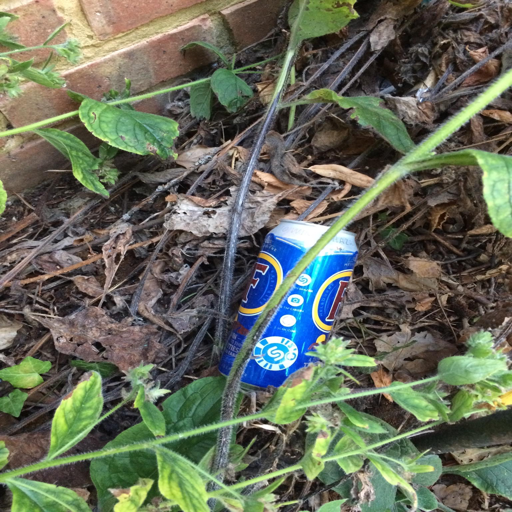

In [39]:
sample_idx = 0

image_tensor, target = tiny_train_dataset[sample_idx]

# image_tensor is [C, H, W] in float32 [0, 1]
image_np = (image_tensor.permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8)
pil_image = Image.fromarray(image_np)

pil_image.resize((512, 512))

In [40]:
target['boxes']

tensor([[ 652.,  874., 1077., 1563.]])

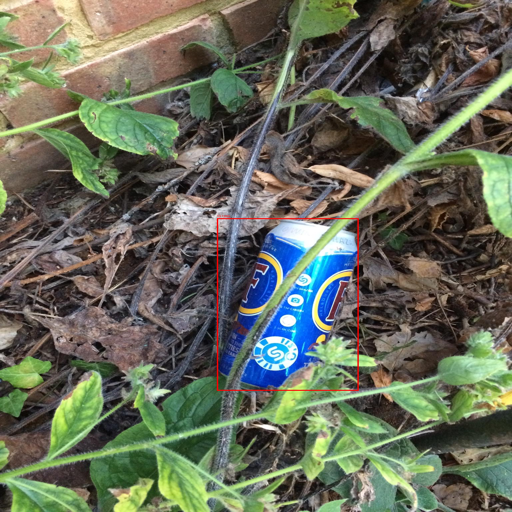

In [41]:
score_threshold = 0.003

result = predict_one_sample(model, tiny_train_dataset, sample_idx, device, score_threshold=0.01)

img_with_boxes = Image.fromarray(
    (result["image"].permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8)
).copy()

draw = ImageDraw.Draw(img_with_boxes)

pred_boxes = result["pred"]["boxes"]
pred_labels = result["pred"]["labels"]
pred_scores = result["pred"]["scores"]

top_k = 1
for box, label, score in zip(
      result["pred"]["boxes"][:top_k],
      result["pred"]["labels"][:top_k],
      result["pred"]["scores"][:top_k],
  ):
    if float(score) < score_threshold:
        continue

    x1, y1, x2, y2 = box.tolist()
    draw.rectangle([x1, y1, x2, y2], outline="red", width=4)
    draw.text((x1, max(0, y1 - 15)), f"{int(label)}:{float(score):.3f}", fill="red")

img_with_boxes.resize((512, 512))

In [42]:
print("gt boxes:", result["target"]["boxes"])
print("top pred boxes:", result["pred"]["boxes"][:5])
print("top pred labels:", result["pred"]["labels"][:5])
print("top pred scores:", result["pred"]["scores"][:5])

gt boxes: tensor([[ 652.,  874., 1077., 1563.]])
top pred boxes: tensor([[ 651.4214,  873.5232, 1076.9414, 1563.7655]])
top pred labels: tensor([13])
top pred scores: tensor([0.9998])


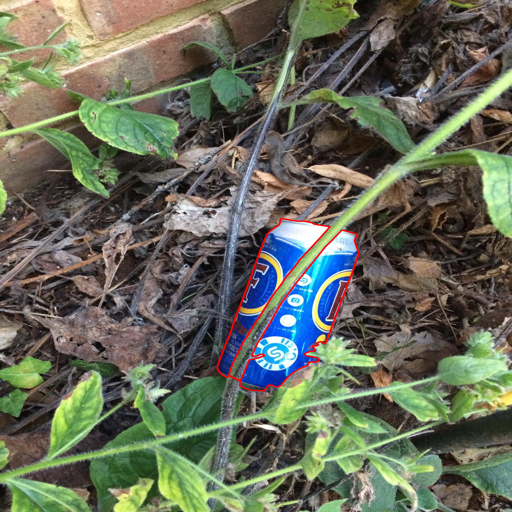

In [43]:
image_tensor, target = tiny_train_dataset[sample_idx]

img_contour = Image.fromarray(
    (image_tensor.permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8)
).copy()

draw = ImageDraw.Draw(img_contour)

masks = target["masks"].cpu().numpy()  # [N, H, W]
thickness = 5
r = thickness // 2

for mask in masks:
    mask = mask.astype(bool)

    # boundary pixels: mask pixels that have at least one neighbor outside the mask
    boundary = np.zeros_like(mask, dtype=bool)
    boundary[1:-1, 1:-1] = (
        mask[1:-1, 1:-1]
        & (
            ~mask[:-2, 1:-1]
            | ~mask[2:, 1:-1]
            | ~mask[1:-1, :-2]
            | ~mask[1:-1, 2:]
        )
    )

    ys, xs = np.where(boundary)

    for x, y in zip(xs, ys):
        draw.ellipse((x - r, y - r, x + r, y + r), fill="red")

img_contour.resize((512, 512))

Seems the model works!

### 3 image overfit

In [45]:
num_epochs = 300
run_prefix= "overfit_3"
model = get_model(num_classes=num_classes, train_mode="heads")
tiny_train_dataset = Subset(train_dataset, [15,49,128])
tiny_train_loader = DataLoader(
    tiny_train_dataset,
    batch_size=1,
    shuffle=True,
    collate_fn=collate_fn,
)

optimizer = torch.optim.SGD(
    [p for p in model.parameters() if p.requires_grad],
    lr=0.001,
    momentum=0.9,
    weight_decay=0.0005,
)


scaler = torch.cuda.amp.GradScaler()

lr_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="min",
    factor=0.5,
    patience=30,
    threshold=1e-4,
    threshold_mode="rel",
    cooldown=10,
    min_lr=1e-6,
)

scaler = torch.cuda.amp.GradScaler()
writer = SummaryWriter(
    log_dir=os.path.join(DEFAULT_RUNS_PATH, f"runs/{run_prefix}")
)

train_model(
    model=model,
    train_loader=tiny_train_loader,
    val_loader=tiny_train_loader,
    optimizer=optimizer,
    scheduler=lr_scheduler,
    scaler=scaler,
    writer=writer,
    num_epoch=num_epochs,
    run_prefix=run_prefix,
    device=device
)

/tmp/ipykernel_925/3885642340.py:20: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()
/tmp/ipykernel_925/3885642340.py:33: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()
Epoch 1. Train: 100%|██████████| 3/3 [00:00<00:00,  3.42it/s]
/usr/local/lib/python3.12/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: DiceScore metric currently defaults to `average=micro`, but will change to`average=macro` in the v1.9 release. If you've explicitly set this parameter, you can ignore this warning.
  warnings.warn(*args, **kwargs)
Train model: 100%|██████████| 300/300 [41:24<00:00,  8.28s/it]


{'train': [{'epoch': 0,
   'train/total_loss': 5.94247579574585,
   'train/loss_classifier': 3.8879051208496094,
   'train/loss_box_reg': 0.02397621589868019,
   'train/loss_mask': 0.9345895449320475,
   'train/loss_objectness': 1.0311000148455303,
   'train/loss_rpn_box_reg': 0.06490480915332834},
  {'epoch': 1,
   'train/total_loss': 5.682097911834717,
   'train/loss_classifier': 3.6373685201009116,
   'train/loss_box_reg': 0.021487201369988423,
   'train/loss_mask': 0.933233916759491,
   'train/loss_objectness': 1.0251726681987445,
   'train/loss_rpn_box_reg': 0.06483551339867215},
  {'epoch': 2,
   'train/total_loss': 4.757216294606526,
   'train/loss_classifier': 2.783578872680664,
   'train/loss_box_reg': 0.018386305930713814,
   'train/loss_mask': 0.8891582091649374,
   'train/loss_objectness': 1.0050853416323662,
   'train/loss_rpn_box_reg': 0.061007455767442785},
  {'epoch': 3,
   'train/total_loss': 3.440277179082235,
   'train/loss_classifier': 1.5570920308430989,
   'train/

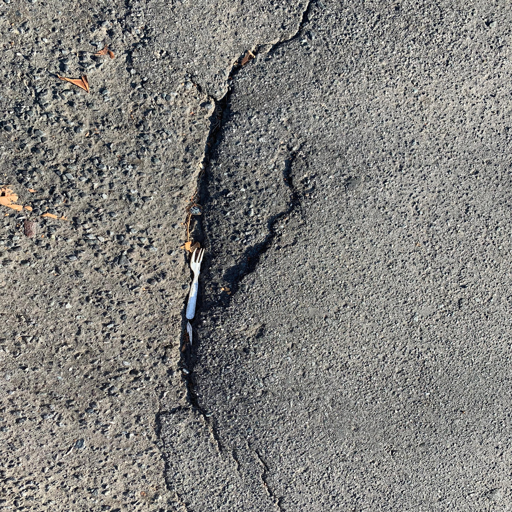

In [46]:
sample_idx = 2

image_tensor, target = tiny_train_dataset[sample_idx]

# image_tensor is [C, H, W] in float32 [0, 1]
image_np = (image_tensor.permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8)
pil_image = Image.fromarray(image_np)

pil_image.resize((512, 512))

In [47]:
result = predict_one_sample(model, tiny_train_dataset, sample_idx, device, score_threshold=score_threshold)
target['boxes'], result['pred']['boxes']

(tensor([[1098., 1952., 1206., 2514.],
         [1103., 2533., 1137., 2722.],
         [1098., 1604., 1194., 1693.]]),
 tensor([[1097.2600, 1953.2518, 1206.3470, 2514.3687],
         [1097.9666, 1603.9087, 1193.6552, 1693.0219],
         [1102.8448, 2533.3977, 1136.6920, 2722.8286],
         [1123.6400, 2534.7678, 1154.4707, 2719.5298],
         [1113.5356, 1635.2750, 1184.4648, 1699.0426],
         [1086.8815, 2524.5867, 1118.4453, 2726.1863],
         [1080.7349, 1606.9718, 1210.2478, 1740.2147],
         [1151.6288, 2554.9792, 1182.6898, 2699.6934],
         [1104.6790, 2195.8506, 1175.8080, 2479.2688],
         [1140.3037, 1980.3524, 1221.1693, 2474.1851],
         [1150.0258, 2177.8594, 1204.4833, 2453.9873]]))

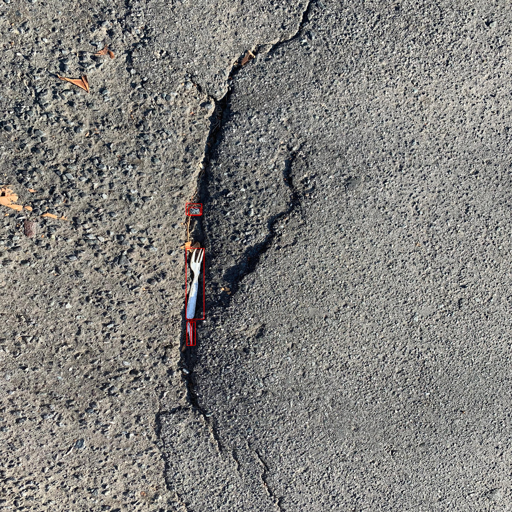

In [48]:
score_threshold = 0.0

result = predict_one_sample(model, tiny_train_dataset, sample_idx, device, score_threshold=score_threshold)

img_with_boxes = Image.fromarray(
    (result["image"].permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8)
).copy()

draw = ImageDraw.Draw(img_with_boxes)

pred_boxes = result["pred"]["boxes"]
pred_labels = result["pred"]["labels"]
pred_scores = result["pred"]["scores"]

top_k = 5
for box, label, score in zip(
      result["pred"]["boxes"][:top_k],
      result["pred"]["labels"][:top_k],
      result["pred"]["scores"][:top_k],
  ):
    if float(score) < score_threshold:
        continue

    x1, y1, x2, y2 = box.tolist()
    draw.rectangle([x1, y1, x2, y2], outline="red", width=4)
    draw.text((x1, max(0, y1 - 15)), f"{int(label)}:{float(score):.3f}", fill="red")

img_with_boxes.resize((512, 512))

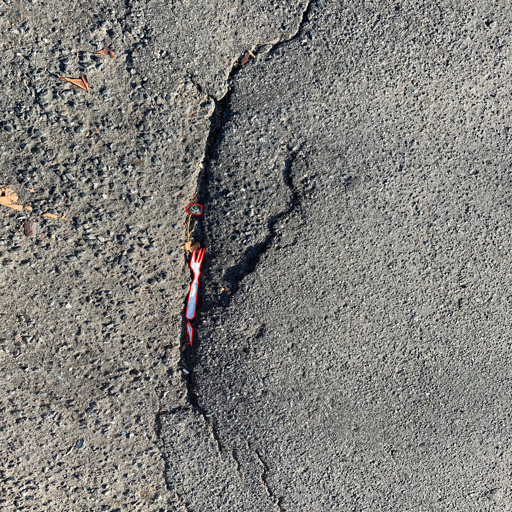

In [49]:
image_tensor, target = tiny_train_dataset[sample_idx]

img_contour = Image.fromarray(
    (image_tensor.permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8)
).copy()

draw = ImageDraw.Draw(img_contour)

masks = target["masks"].cpu().numpy()  # [N, H, W]
thickness = 5
r = thickness // 2

for mask in masks:
    mask = mask.astype(bool)

    # boundary pixels: mask pixels that have at least one neighbor outside the mask
    boundary = np.zeros_like(mask, dtype=bool)
    boundary[1:-1, 1:-1] = (
        mask[1:-1, 1:-1]
        & (
            ~mask[:-2, 1:-1]
            | ~mask[2:, 1:-1]
            | ~mask[1:-1, :-2]
            | ~mask[1:-1, 2:]
        )
    )

    ys, xs = np.where(boundary)

    for x, y in zip(xs, ys):
        draw.ellipse((x - r, y - r, x + r, y + r), fill="red")

img_contour.resize((512, 512))

It works worse, but it still able to define the object and draw bbox and mask

### 8 image overfit

In [50]:
ids = np.random.choice(1200, size=8, replace=False)
ids

array([1178,  865,  101,  439,   58, 1120,  323,  974])

In [51]:
num_epochs = 200
run_prefix= "overfit_8"
model = get_model(num_classes=num_classes, train_mode="heads")
tiny_train_dataset = Subset(train_dataset, ids)
tiny_train_loader = DataLoader(
    tiny_train_dataset,
    batch_size=1,
    shuffle=True,
    collate_fn=collate_fn,
)

optimizer = torch.optim.SGD(
    [p for p in model.parameters() if p.requires_grad],
    lr=0.001,
    momentum=0.9,
    weight_decay=0.0005,
)


scaler = torch.cuda.amp.GradScaler()

lr_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="min",
    factor=0.5,
    patience=30,
    threshold=1e-4,
    threshold_mode="rel",
    cooldown=10,
    min_lr=1e-6,
)

scaler = torch.cuda.amp.GradScaler()
writer = SummaryWriter(
    log_dir=os.path.join(DEFAULT_RUNS_PATH, f"runs/{run_prefix}")
)

train_model(
    model=model,
    train_loader=tiny_train_loader,
    val_loader=tiny_train_loader,
    optimizer=optimizer,
    scheduler=lr_scheduler,
    scaler=scaler,
    writer=writer,
    num_epoch=num_epochs,
    run_prefix=run_prefix,
    device=device
)

/tmp/ipykernel_925/625634916.py:20: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()
/tmp/ipykernel_925/625634916.py:33: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()
Epoch 1. Train: 100%|██████████| 8/8 [00:02<00:00,  3.91it/s]
/usr/local/lib/python3.12/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: DiceScore metric currently defaults to `average=micro`, but will change to`average=macro` in the v1.9 release. If you've explicitly set this parameter, you can ignore this warning.
  warnings.warn(*args, **kwargs)
Train model: 100%|██████████| 200/200 [40:49<00:00, 12.25s/it]


{'train': [{'epoch': 0,
   'train/total_loss': 5.0481650829315186,
   'train/loss_classifier': 3.712705612182617,
   'train/loss_box_reg': 0.06534807846765034,
   'train/loss_mask': 0.8881351724267006,
   'train/loss_objectness': 0.34448316623456776,
   'train/loss_rpn_box_reg': 0.037493038253160194},
  {'epoch': 1,
   'train/total_loss': 2.5769473910331726,
   'train/loss_classifier': 1.3092583492398262,
   'train/loss_box_reg': 0.06503310959669761,
   'train/loss_mask': 0.8276420682668686,
   'train/loss_objectness': 0.3374065876159875,
   'train/loss_rpn_box_reg': 0.03760724773746915},
  {'epoch': 2,
   'train/total_loss': 1.3263725638389587,
   'train/loss_classifier': 0.16605681809596717,
   'train/loss_box_reg': 0.06945953171816655,
   'train/loss_mask': 0.7406946793198586,
   'train/loss_objectness': 0.3143440046260366,
   'train/loss_rpn_box_reg': 0.03581755643244833},
  {'epoch': 3,
   'train/total_loss': 1.2131804451346397,
   'train/loss_classifier': 0.1908675474114716,
   '

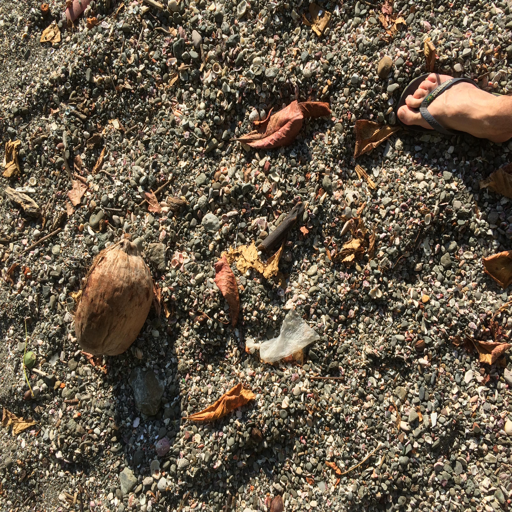

In [52]:
sample_idx = 6

image_tensor, target = tiny_train_dataset[sample_idx]

# image_tensor is [C, H, W] in float32 [0, 1]
image_np = (image_tensor.permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8)
pil_image = Image.fromarray(image_np)

pil_image.resize((512, 512))

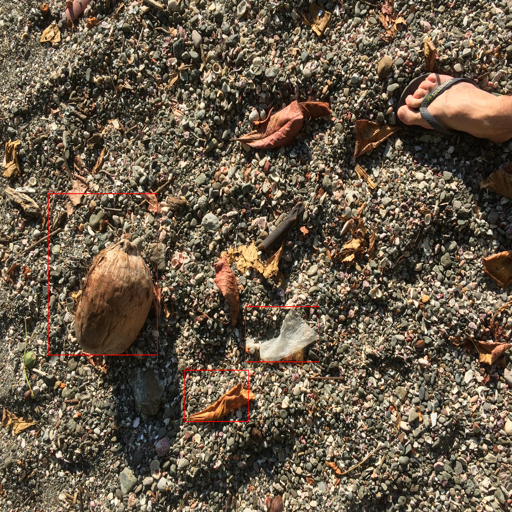

In [53]:
score_threshold = 0.0

result = predict_one_sample(model, tiny_train_dataset, sample_idx, device, score_threshold=score_threshold)

img_with_boxes = Image.fromarray(
    (result["image"].permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8)
).copy()

draw = ImageDraw.Draw(img_with_boxes)

pred_boxes = result["pred"]["boxes"]
pred_labels = result["pred"]["labels"]
pred_scores = result["pred"]["scores"]

top_k = 5
for box, label, score in zip(
      result["pred"]["boxes"][:top_k],
      result["pred"]["labels"][:top_k],
      result["pred"]["scores"][:top_k],
  ):
    if float(score) < score_threshold:
        continue

    x1, y1, x2, y2 = box.tolist()
    draw.rectangle([x1, y1, x2, y2], outline="red", width=4)
    draw.text((x1, max(0, y1 - 15)), f"{int(label)}:{float(score):.3f}", fill="red")

img_with_boxes.resize((512, 512))

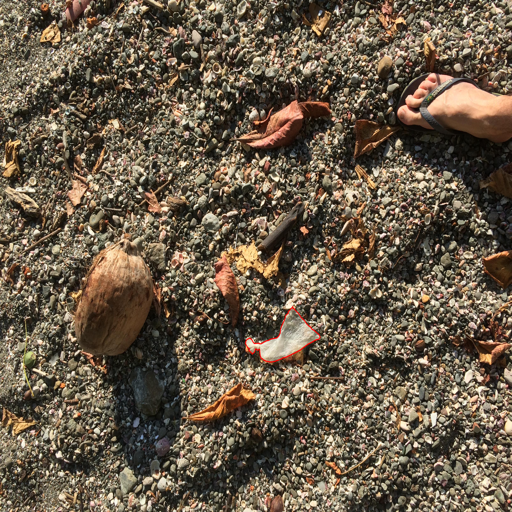

In [54]:
image_tensor, target = tiny_train_dataset[sample_idx]

img_contour = Image.fromarray(
    (image_tensor.permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8)
).copy()

draw = ImageDraw.Draw(img_contour)

masks = target["masks"].cpu().numpy()  # [N, H, W]
thickness = 5
r = thickness // 2

for mask in masks:
    mask = mask.astype(bool)

    # boundary pixels: mask pixels that have at least one neighbor outside the mask
    boundary = np.zeros_like(mask, dtype=bool)
    boundary[1:-1, 1:-1] = (
        mask[1:-1, 1:-1]
        & (
            ~mask[:-2, 1:-1]
            | ~mask[2:, 1:-1]
            | ~mask[1:-1, :-2]
            | ~mask[1:-1, 2:]
        )
    )

    ys, xs = np.where(boundary)

    for x, y in zip(xs, ys):
        draw.ellipse((x - r, y - r, x + r, y + r), fill="red")

img_contour.resize((512, 512))

### 32 images overfit

In [55]:
# ids of the subset 
ids = np.random.choice(1200, size=32, replace=False)
ids

array([ 410,  199,   82, 1124, 1038,  891,  254,  595,   47,  255,  644,
        510,  528,   93,  770,  111,  740,  851,  657,  998,  684,  498,
       1016,  188,  969,  486,  134,  736,  705,  833,  993,   56])

In [ ]:
num_epochs = 50
run_prefix= "overfit_32"
model = get_model(num_classes=num_classes, train_mode="heads")
tiny_train_dataset = Subset(train_dataset, ids)
tiny_train_loader = DataLoader(
    tiny_train_dataset,
    batch_size=1,
    shuffle=True,
    collate_fn=collate_fn,
)

optimizer = torch.optim.SGD(
    [p for p in model.parameters() if p.requires_grad],
    lr=0.001,
    momentum=0.9,
    weight_decay=0.0005,
)


scaler = torch.cuda.amp.GradScaler()

lr_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="min",
    factor=0.5,
    patience=30,
    threshold=1e-4,
    threshold_mode="rel",
    cooldown=10,
    min_lr=1e-6,
)

scaler = torch.cuda.amp.GradScaler()
writer = SummaryWriter(
    log_dir=os.path.join(DEFAULT_RUNS_PATH, f"runs/{run_prefix}")
)

train_model(
    model=model,
    train_loader=tiny_train_loader,
    val_loader=tiny_train_loader,
    optimizer=optimizer,
    scheduler=lr_scheduler,
    scaler=scaler,
    writer=writer,
    num_epoch=num_epochs,
    run_prefix=run_prefix,
    device=device
)

/tmp/ipykernel_925/466095190.py:20: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()
/tmp/ipykernel_925/466095190.py:33: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()
Epoch 1. Train: 100%|██████████| 32/32 [00:10<00:00,  3.04it/s]
/usr/local/lib/python3.12/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: DiceScore metric currently defaults to `average=micro`, but will change to`average=macro` in the v1.9 release. If you've explicitly set this parameter, you can ignore this warning.
  warnings.warn(*args, **kwargs)
Epoch 3. Train: 100%|██████████| 32/32 [00:09<00:00,  3.23it/s]


In [ ]:
sample_idx = 14

image_tensor, target = tiny_train_dataset[sample_idx]

# image_tensor is [C, H, W] in float32 [0, 1]
image_np = (image_tensor.permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8)
pil_image = Image.fromarray(image_np)

pil_image.resize((512, 512))

In [ ]:
score_threshold = 0.0

result = predict_one_sample(model, tiny_train_dataset, sample_idx, device, score_threshold=score_threshold)

img_with_boxes = Image.fromarray(
    (result["image"].permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8)
).copy()

draw = ImageDraw.Draw(img_with_boxes)

pred_boxes = result["pred"]["boxes"]
pred_labels = result["pred"]["labels"]
pred_scores = result["pred"]["scores"]

top_k = 5
for box, label, score in zip(
      result["pred"]["boxes"][:top_k],
      result["pred"]["labels"][:top_k],
      result["pred"]["scores"][:top_k],
  ):
    if float(score) < score_threshold:
        continue

    x1, y1, x2, y2 = box.tolist()
    draw.rectangle([x1, y1, x2, y2], outline="red", width=4)
    draw.text((x1, max(0, y1 - 15)), f"{int(label)}:{float(score):.3f}", fill="red")

img_with_boxes.resize((512, 512))

In [ ]:
image_tensor, target = tiny_train_dataset[sample_idx]

img_contour = Image.fromarray(
    (image_tensor.permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8)
).copy()

draw = ImageDraw.Draw(img_contour)

masks = result["pred"]["masks"].cpu().numpy()   # [N, 1, H, W]
thickness = 5
r = thickness // 2

for mask in masks:
    mask = (mask.squeeze(0) >= 0.3)   # [H, W]

    boundary = np.zeros_like(mask, dtype=bool)
    boundary[1:-1, 1:-1] = (
        mask[1:-1, 1:-1]
        & (
            ~mask[:-2, 1:-1]
            | ~mask[2:, 1:-1]
            | ~mask[1:-1, :-2]
            | ~mask[1:-1, 2:]
        )
    )

    ys, xs = np.where(boundary)

    for x, y in zip(xs, ys):
        draw.ellipse((x - r, y - r, x + r, y + r), fill="red")

img_contour.resize((512, 512))

After the overfit checks, the model is trained on the full training split with `train_mode="heads"`. In this mode, the backbone stays frozen while the RPN and ROI heads are updated.


### Full dataset evaluation

Train mode `heads`

In [ ]:
num_epochs = 30
run_preifx = f"head_{num_epochs}_bbox_scheduler_max"
model = get_model(
    num_classes=num_classes,
    train_mode="heads"
)

optimizer = torch.optim.SGD(
    [p for p in model.parameters() if p.requires_grad],
    lr=1e-3,
    momentum=0.9,
    weight_decay=0.0005,
)

lr_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="max",
    factor=0.5,
    patience=4,
    threshold=1e-4,
    min_lr=1e-5,
)

scaler = torch.cuda.amp.GradScaler()
writer = SummaryWriter(
    log_dir=os.path.join(DEFAULT_RUNS_PATH, f"runs/{run_preifx}")
)
history = train_model(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    optimizer=optimizer,
    scheduler=lr_scheduler,
    scaler=scaler,
    writer=writer,
    num_epoch=num_epochs,
    run_prefix=run_preifx,
    eval_every=2,
    metrics_csv_paths={
        'train': os.path.join(DEFAULT_RUNS_PATH, f'{run_preifx}_train.csv'),
        'eval': os.path.join(DEFAULT_RUNS_PATH, f'{run_preifx}_eval.csv')
    },
    device=device,
    checkpoint_score_fn = score_by_eval_bbox_map_50,
    scheduler_step_fn = step_on_val_bbox_map_50
)

This prediction inspection cell is used to visually verify the trained model output on a validation sample before looking only at aggregate metrics.


In [ ]:
@torch.no_grad()
def predict_one(
    model: torch.nn.Module,
    dataset: Dataset,
    idx: int,
    device: torch.device,
) -> dict[str, Any]:
    """Run inference for one sample and return image, target, and raw model output on CPU."""
    model.eval()

    image, target = dataset[idx]
    output = model([image.to(device)])[0]

    return {
        "image": image.cpu(),
        "target": {
            k: v.cpu() if isinstance(v, torch.Tensor) else v
            for k, v in target.items()
        },
        "output": {
            k: v.detach().cpu() if isinstance(v, torch.Tensor) else v
            for k, v in output.items()
        },
    }

sample_idx = 12
result = predict_one(model, val_dataset, sample_idx, device)

out = result["output"]

print("num predictions:", len(out["boxes"]))
print("boxes:", out["boxes"][:20])
print("labels:", out["labels"][:20])
print("scores:", out["scores"][:20])
print("masks shape:", out["masks"].shape)

print("target boxes:", result["target"]["boxes"])
print("target labels:", result["target"]["labels"])
print("target masks shape:", result["target"]["masks"].shape)


num predictions: 3
boxes: tensor([[1274.8387, 1032.0236, 1857.7220, 2448.2478],
        [ 509.2026,  907.1823, 2329.2959, 3120.0000],
        [1128.6522, 1055.2964, 1876.2821, 2680.9197]])
labels: tensor([55, 33, 49])
scores: tensor([0.7158, 0.4074, 0.3819])
masks shape: torch.Size([3, 1, 3120, 4160])
target boxes: tensor([[1329.,  964., 1935., 2687.],
        [1293.,  989., 2854., 1558.]])
target labels: tensor([30, 30])
target masks shape: torch.Size([2, 3120, 4160])


#### Filter predictions

In [ ]:
score_threshold = 0.3

keep = out["scores"] >= score_threshold

pred_boxes = out["boxes"][keep]
pred_labels = out["labels"][keep]
pred_scores = out["scores"][keep]
pred_masks = out["masks"][keep]

print("kept predictions:", len(pred_boxes))
print("kept boxes:", pred_boxes)
print("kept labels:", pred_labels)
print("kept scores:", pred_scores)
print("kept masks:", pred_masks.shape)

kept predictions: 3
kept boxes: tensor([[1274.8387, 1032.0236, 1857.7220, 2448.2478],
        [ 509.2026,  907.1823, 2329.2959, 3120.0000],
        [1128.6522, 1055.2964, 1876.2821, 2680.9197]])
kept labels: tensor([55, 33, 49])
kept scores: tensor([0.7158, 0.4074, 0.3819])
kept masks: torch.Size([3, 1, 3120, 4160])


#### Draw predicted boxes

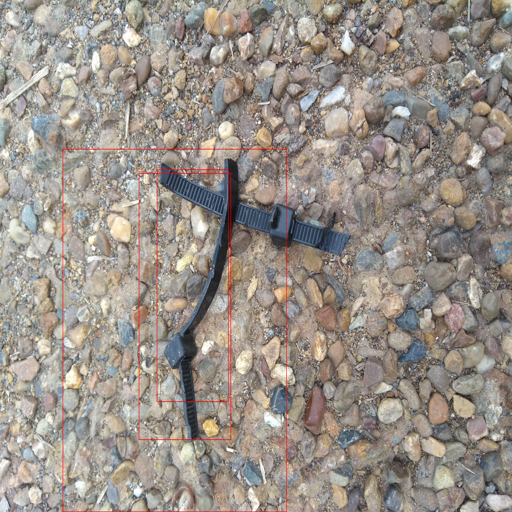

In [ ]:
from PIL import Image, ImageDraw
import numpy as np

image = result["image"]

img = Image.fromarray(
    (image.permute(1, 2, 0).numpy() * 255).astype(np.uint8)
).copy()

draw = ImageDraw.Draw(img)

for box, label, score in zip(pred_boxes, pred_labels, pred_scores):
    x1, y1, x2, y2 = box.tolist()

    draw.rectangle(
        [x1, y1, x2, y2],
        outline="red",
        width=4,
    )

    draw.text(
        (x1, max(0, y1 - 15)),
        f"{int(label)} {float(score):.3f}",
        fill="red",
    )

img.resize((512, 512))

#### Draw predicted max contours

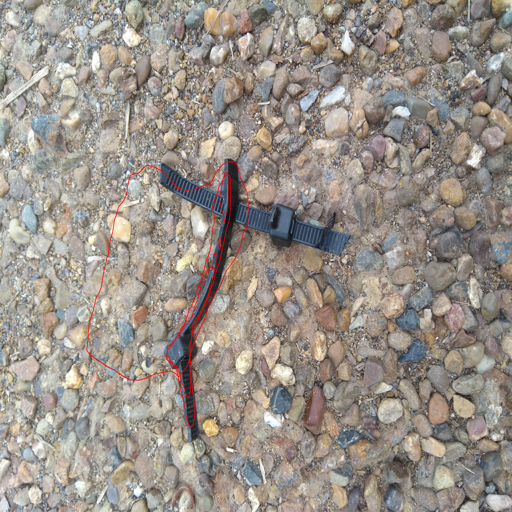

In [ ]:
img_mask = Image.fromarray(
    (image.permute(1, 2, 0).numpy() * 255).astype(np.uint8)
).copy()

draw = ImageDraw.Draw(img_mask)

mask_threshold = 0.5
thickness = 5
r = thickness // 2

masks = pred_masks.squeeze(1).numpy()  # [N, H, W]

for mask in masks:
    mask = mask >= mask_threshold

    boundary = np.zeros_like(mask, dtype=bool)
    boundary[1:-1, 1:-1] = (
        mask[1:-1, 1:-1]
        & (
            ~mask[:-2, 1:-1]
            | ~mask[2:, 1:-1]
            | ~mask[1:-1, :-2]
            | ~mask[1:-1, 2:]
        )
    )

    ys, xs = np.where(boundary)

    for x, y in zip(xs, ys):
        draw.ellipse((x - r, y - r, x + r, y + r), fill="red")

img_mask.resize((512, 512))

#### Observations

In [13]:
eval_df = pd.read_csv(os.path.join(DATAFRAME_PATH, "head_30_test_scheduler_max_eval.csv"))
eval_df

,Unnamed: 0,epoch,run_prefix,checkpoint_score,checkpoint_metric,best_score,best_epoch,lr,eval/bbox_map,eval/bbox_map_50,...,eval/match_rate,eval/class_accuracy_on_matches,eval/images_with_no_predictions,eval/images_with_no_matches,eval/mean_top1_score,eval/mean_matched_score,eval/mean_unmatched_score,eval_per_class/bbox_map/Aluminium foil,eval_per_class/bbox_mar_100/Aluminium foil,eval_per_class/segm_map/Aluminium foil
0,0,1,head_30_test_scheduler_max,0.024430,eval/bbox_map_50,0.024430,1,0.001,0.012768,0.024430,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0
1,1,3,head_30_test_scheduler_max,0.033148,eval/bbox_map_50,0.033148,3,0.001,0.018587,0.033148,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0
2,2,5,head_30_test_scheduler_max,0.041638,eval/bbox_map_50,0.041638,5,0.001,0.023437,0.041638,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0
3,3,7,head_30_test_scheduler_max,0.049280,eval/bbox_map_50,0.049280,7,0.001,0.030034,0.049280,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0
4,4,9,head_30_test_scheduler_max,0.045606,eval/bbox_map_50,0.049280,7,0.001,0.026754,0.045606,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0
5,5,11,head_30_test_scheduler_max,0.046861,eval/bbox_map_50,0.049280,7,0.001,0.026012,0.046861,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0
6,6,13,head_30_test_scheduler_max,0.047645,eval/bbox_map_50,0.049280,7,0.001,0.025217,0.047645,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0
7,7,15,head_30_test_scheduler_max,0.045307,eval/bbox_map_50,0.049280,7,0.001,0.023160,0.045307,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0
8,8,17,head_30_test_scheduler_max,0.052781,eval/bbox_map_50,0.052781,17,0.001,0.027560,0.052781,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0
9,9,19,head_30_test_scheduler_max,0.054254,eval/bbox_map_50,0.054254,19,0.001,0.031228,0.054254,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0


##### Best Epoch Summary

In [ ]:
best_row = eval_df.loc[eval_df["eval/bbox_map_50"].idxmax()]

best_summary = best_row[
    [
        "epoch",
        "eval/bbox_map",
        "eval/bbox_map_50",
        "eval/bbox_map_75",
        "eval/bbox_mar_100",
        "eval/segm_map",
        "eval/segm_map_50",
        "eval/segm_map_75",
        "eval/segm_mar_100",
        "eval/dice",
        "eval/mask_miou",
    ]
]

best_summary

,13
epoch,27
eval/bbox_map,0.034393
eval/bbox_map_50,0.065535
eval/bbox_map_75,0.034626
eval/bbox_mar_100,0.104484
eval/segm_map,0.039002
eval/segm_map_50,0.060155
eval/segm_map_75,0.043352
eval/segm_mar_100,0.115907
eval/dice,0.865442


##### Bbox Metrics Plot

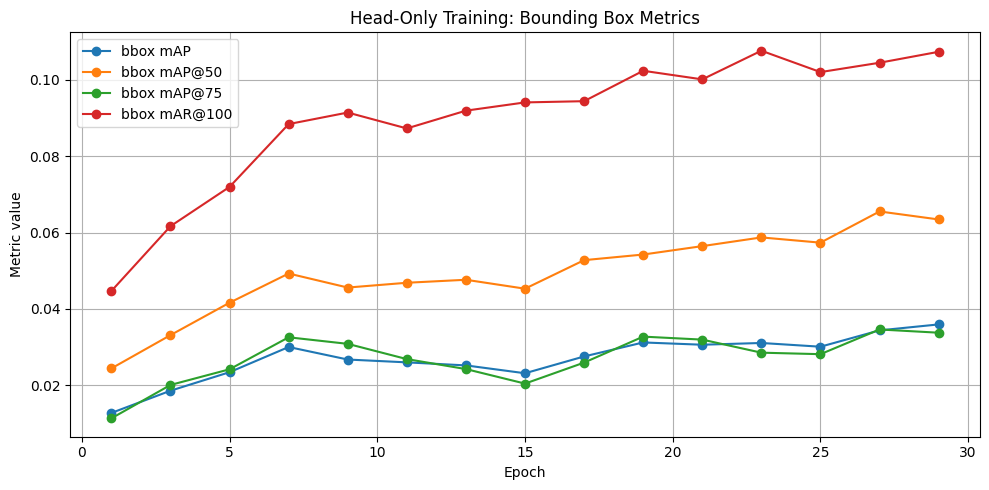

In [14]:
plt.figure(figsize=(10, 5))

plt.plot(eval_df["epoch"], eval_df["eval/bbox_map"], marker="o", label="bbox mAP")
plt.plot(eval_df["epoch"], eval_df["eval/bbox_map_50"], marker="o", label="bbox mAP@50")
plt.plot(eval_df["epoch"], eval_df["eval/bbox_map_75"], marker="o", label="bbox mAP@75")
plt.plot(eval_df["epoch"], eval_df["eval/bbox_mar_100"], marker="o", label="bbox mAR@100")

plt.title("Head-Only Training: Bounding Box Metrics")
plt.xlabel("Epoch")
plt.ylabel("Metric value")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

Observation: Bounding-box metrics improve during head-only training. The strongest improvement is visible in `bbox_map_50`, which grows from approximately 0.024 to 0.066. This indicates that the model starts learning object localization, but the final value is still low.

##### Segmentation Metrics

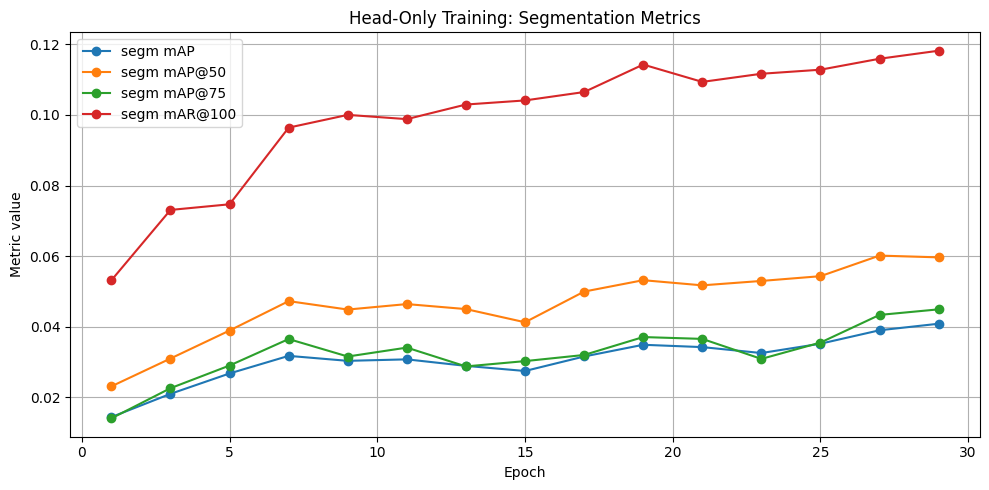

In [15]:
plt.figure(figsize=(10, 5))

plt.plot(eval_df["epoch"], eval_df["eval/segm_map"], marker="o", label="segm mAP")
plt.plot(eval_df["epoch"], eval_df["eval/segm_map_50"], marker="o", label="segm mAP@50")
plt.plot(eval_df["epoch"], eval_df["eval/segm_map_75"], marker="o", label="segm mAP@75")
plt.plot(eval_df["epoch"], eval_df["eval/segm_mar_100"], marker="o", label="segm mAR@100")

plt.title("Head-Only Training: Segmentation Metrics")
plt.xlabel("Epoch")
plt.ylabel("Metric value")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

Observation: Segmentation metrics follow the same general trend as bounding-box metrics. This is expected for Mask R-CNN because mask predictions depend on the detected object proposals.

##### Bbox vs Segmentation mAP@50

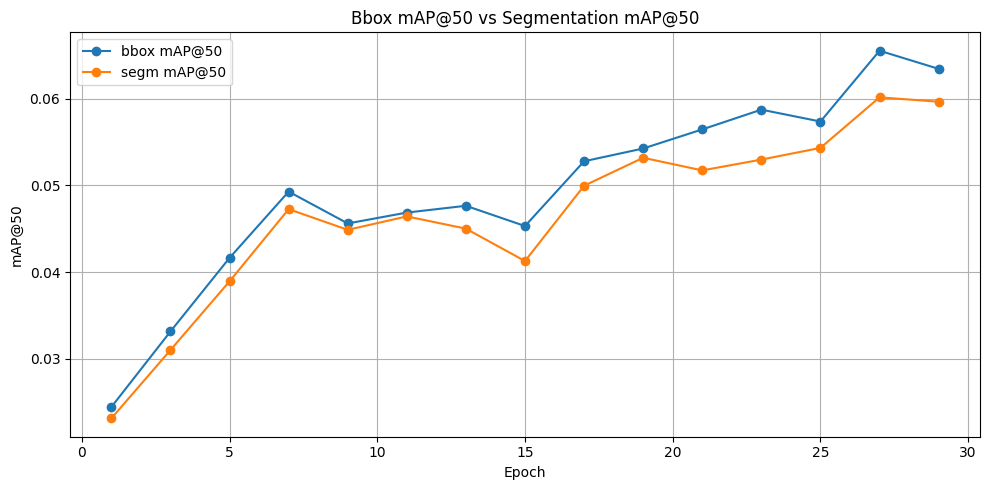

In [16]:
plt.figure(figsize=(10, 5))

plt.plot(eval_df["epoch"], eval_df["eval/bbox_map_50"], marker="o", label="bbox mAP@50")
plt.plot(eval_df["epoch"], eval_df["eval/segm_map_50"], marker="o", label="segm mAP@50")

plt.title("Bbox mAP@50 vs Segmentation mAP@50")
plt.xlabel("Epoch")
plt.ylabel("mAP@50")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

Observation: `bbox_map_50` and `segm_map_50` are close to each other. This suggests that segmentation quality is limited by the same factors as detection: proposal quality, small object size, and class ambiguity.

##### Dice / Mask IoU

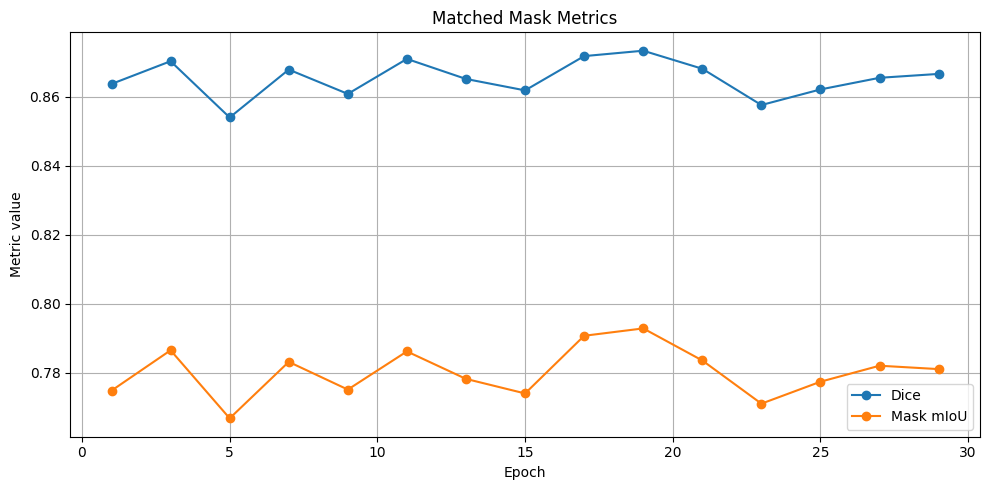

In [17]:
plt.figure(figsize=(10, 5))

plt.plot(eval_df["epoch"], eval_df["eval/dice"], marker="o", label="Dice")
plt.plot(eval_df["epoch"], eval_df["eval/mask_miou"], marker="o", label="Mask mIoU")

plt.title("Matched Mask Metrics")
plt.xlabel("Epoch")
plt.ylabel("Metric value")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

Observation: Dice and mask mIoU are much higher than mAP metrics. These values should be interpreted carefully because they are calculated only on matched masks. They do not fully reflect missed detections or false positives. For the project objective, `bbox_map_50` remains the primary metric.

##### Best Score Over Time

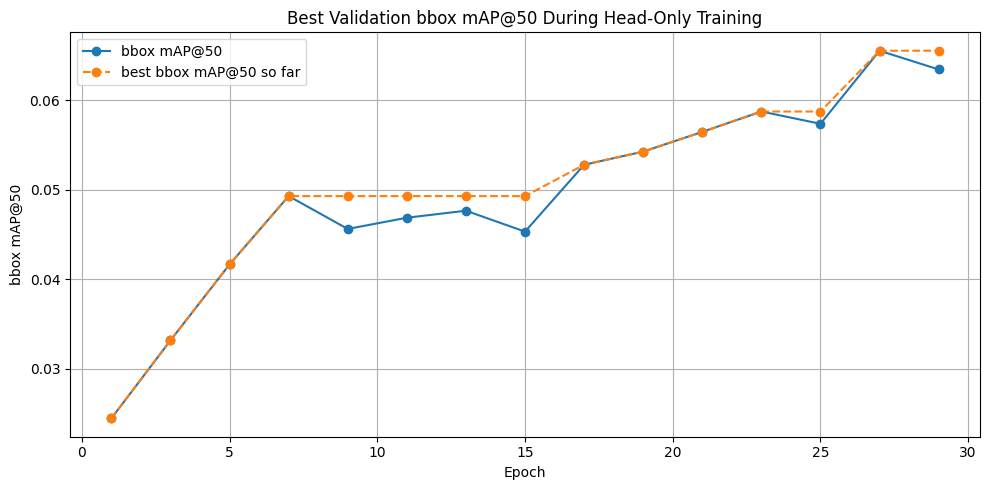

In [18]:
eval_df["best_bbox_map_50_so_far"] = eval_df["eval/bbox_map_50"].cummax()

plt.figure(figsize=(10, 5))

plt.plot(eval_df["epoch"], eval_df["eval/bbox_map_50"], marker="o", label="bbox mAP@50")
plt.plot(
    eval_df["epoch"],
    eval_df["best_bbox_map_50_so_far"],
    marker="o",
    linestyle="--",
    label="best bbox mAP@50 so far",
)

plt.title("Best Validation bbox mAP@50 During Head-Only Training")
plt.xlabel("Epoch")
plt.ylabel("bbox mAP@50")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

Observation: The best validation score is reached near the end of training, at epoch 27. This means the head-only model did not clearly overfit within 30 epochs, but the absolute score remains low.

##### Head training conclusion

Head-only Mask R-CNN training on the full dataset gives a useful first baseline. The validation `bbox_map_50` improves from approximately 0.024 to 0.066, which confirms that the model is learning fro the dataset.

However, the score remains far below the target threshold. This suggests that training only the detection heads is insufficient for this task. The dataset contains many small objects, many visually similar classes, and strong class imbalance, so further work is required.

The second stage resumes from the best head-only checkpoint and switches to `train_mode="all"`. This updates the full network with a smaller learning rate.


#### Train mode `all`

In [ ]:
num_epochs = 30
run_prefix = f"full_all_{num_epochs}"

model = get_model(num_classes, train_mode="all")

checkpoint = load_checkpoint(
    path=os.path.join(DEFAULT_RUNS_PATH, "checkpoints", "head_30_test_scheduler_max_best_model.pt"),
    model=model,
    device=device,
)

optimizer = torch.optim.SGD(
    [p for p in model.parameters() if p.requires_grad],
    lr=1e-4,
    momentum=0.9,
    weight_decay=0.0005,
)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="max",
    factor=0.5,
    patience=4,
    threshold=1e-4,
    threshold_mode="rel",
    cooldown=1,
    min_lr=1e-6,
)

scaler = torch.cuda.amp.GradScaler()
writer = SummaryWriter(
    log_dir=os.path.join(DEFAULT_RUNS_PATH, f"runs/{run_prefix}")
)
history = train_model(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    optimizer=optimizer,
    scheduler=lr_scheduler,
    scaler=scaler,
    writer=writer,
    num_epoch=num_epochs,
    run_prefix=run_prefix,
    eval_every=2,
    metrics_csv_paths={
        'train': os.path.join(DEFAULT_RUNS_PATH, f'{run_prefix}_train.csv'),
        'eval': os.path.join(DEFAULT_RUNS_PATH, f'{run_prefix}_eval.csv')
    },
    device=device,
    scheduler_step_fn=step_on_val_segm_map_50
)

##### Observations

In [9]:
full_eval_df = pd.read_csv(os.path.join(DATAFRAME_PATH, "full_all_30_eval.csv"))
full_eval_df

,Unnamed: 0,epoch,run_prefix,checkpoint_score,checkpoint_metric,best_score,best_epoch,lr,eval/bbox_map,eval/bbox_map_50,eval/bbox_map_75,eval/bbox_mar_100,eval/segm_map,eval/segm_map_50,eval/segm_map_75,eval/segm_mar_100,eval/dice,eval/generalized_dice,eval/mask_miou
0,0,1,full_all_30,0.055743,eval/bbox_map_50,0.055743,1,0.001,0.032048,0.055743,0.039145,0.051276,0.035886,0.053049,0.037733,0.056269,0.881413,0.881413,0.802187
1,1,3,full_all_30,0.055444,eval/bbox_map_50,0.055743,1,0.001,0.033018,0.055444,0.037540,0.055756,0.037903,0.055331,0.041050,0.061896,0.888244,0.888244,0.809642
2,2,5,full_all_30,0.055985,eval/bbox_map_50,0.055985,5,0.001,0.037272,0.055985,0.043796,0.060012,0.040625,0.055081,0.046348,0.065232,0.883956,0.883956,0.802641
3,3,7,full_all_30,0.056184,eval/bbox_map_50,0.056184,7,0.001,0.035490,0.056184,0.040444,0.057646,0.037973,0.053855,0.041089,0.060585,0.881560,0.881560,0.798044
4,4,9,full_all_30,0.051412,eval/bbox_map_50,0.056184,7,0.001,0.032083,0.051412,0.035678,0.059288,0.034379,0.049301,0.037017,0.063086,0.871656,0.871656,0.788181
5,5,11,full_all_30,0.060646,eval/bbox_map_50,0.060646,11,0.001,0.037953,0.060646,0.041862,0.065720,0.041666,0.058039,0.046905,0.071377,0.887294,0.887293,0.809987
6,6,13,full_all_30,0.064664,eval/bbox_map_50,0.064664,13,0.001,0.044503,0.064664,0.055476,0.066997,0.045604,0.063284,0.051121,0.070561,0.904098,0.904098,0.833239
7,7,15,full_all_30,0.056719,eval/bbox_map_50,0.064664,13,0.001,0.039191,0.056719,0.047779,0.065511,0.041999,0.057520,0.046115,0.069445,0.889678,0.889678,0.812578
8,8,17,full_all_30,0.062208,eval/bbox_map_50,0.064664,13,0.001,0.039331,0.062208,0.044650,0.063003,0.042965,0.060890,0.047029,0.066963,0.890588,0.890588,0.815798
9,9,19,full_all_30,0.060407,eval/bbox_map_50,0.064664,13,0.001,0.038360,0.060407,0.043906,0.065989,0.040140,0.058856,0.045203,0.068871,0.889102,0.889102,0.811928


##### Best epoch

In [10]:
best_full_row = full_eval_df.loc[full_eval_df["eval/bbox_map_50"].idxmax()]

best_full_row[
    [
        "epoch",
        "eval/bbox_map",
        "eval/bbox_map_50",
        "eval/bbox_map_75",
        "eval/bbox_mar_100",
        "eval/segm_map",
        "eval/segm_map_50",
        "eval/segm_map_75",
        "eval/segm_mar_100",
        "eval/dice",
        "eval/mask_miou",
        "lr",
    ]
]

,10
epoch,21
eval/bbox_map,0.044147
eval/bbox_map_50,0.065491
eval/bbox_map_75,0.053491
eval/bbox_mar_100,0.06597
eval/segm_map,0.047396
eval/segm_map_50,0.067423
eval/segm_map_75,0.052276
eval/segm_mar_100,0.070228
eval/dice,0.889014


##### Bbox Metrics

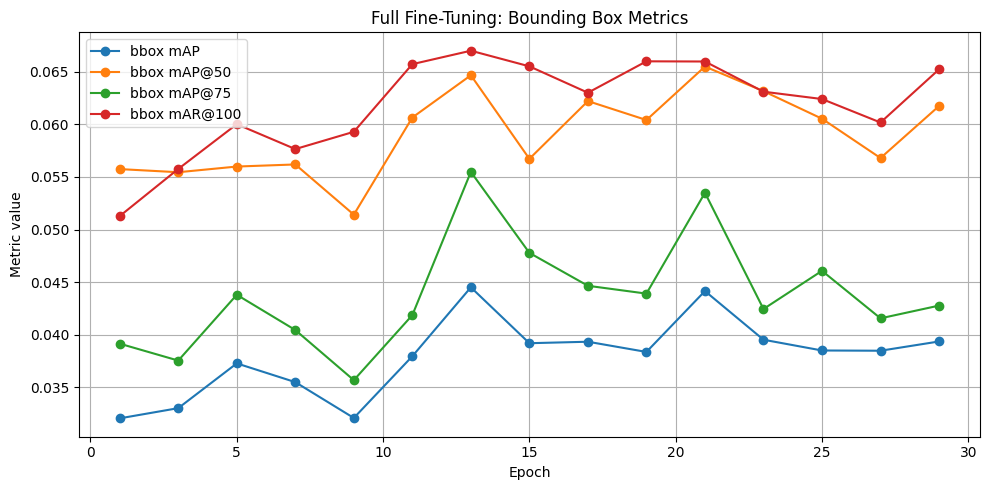

In [11]:
plt.figure(figsize=(10, 5))

plt.plot(full_eval_df["epoch"], full_eval_df["eval/bbox_map"], marker="o", label="bbox mAP")
plt.plot(full_eval_df["epoch"], full_eval_df["eval/bbox_map_50"], marker="o", label="bbox mAP@50")
plt.plot(full_eval_df["epoch"], full_eval_df["eval/bbox_map_75"], marker="o", label="bbox mAP@75")
plt.plot(full_eval_df["epoch"], full_eval_df["eval/bbox_mar_100"], marker="o", label="bbox mAR@100")

plt.title("Full Fine-Tuning: Bounding Box Metrics")
plt.xlabel("Epoch")
plt.ylabel("Metric value")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

Observation: Bounding-box metrics fluctuate during full fine-tuning. The best `bbox_map_50` is reached at epoch 21 with a value of approximately 0.0655. The score does not improve clearly after that point.

##### Segmentation Metrics

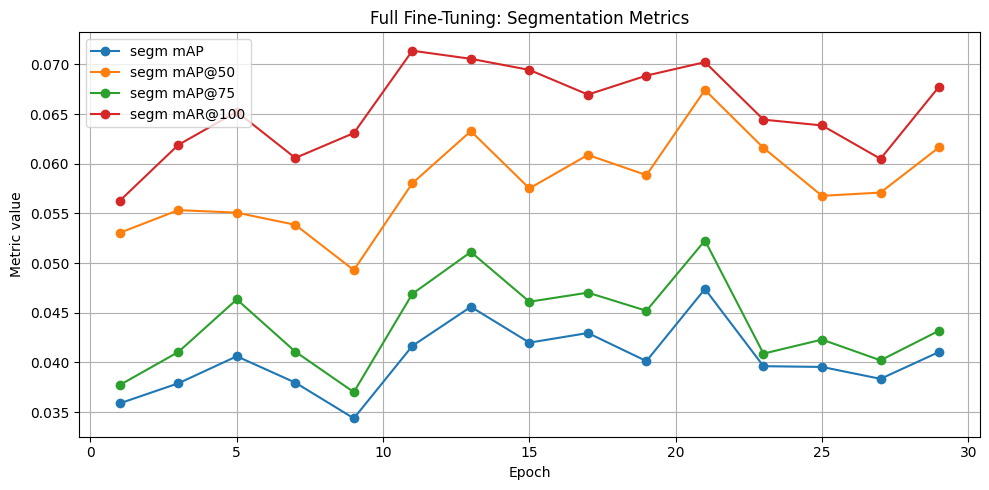

In [12]:
plt.figure(figsize=(10, 5))

plt.plot(full_eval_df["epoch"], full_eval_df["eval/segm_map"], marker="o", label="segm mAP")
plt.plot(full_eval_df["epoch"], full_eval_df["eval/segm_map_50"], marker="o", label="segm mAP@50")
plt.plot(full_eval_df["epoch"], full_eval_df["eval/segm_map_75"], marker="o", label="segm mAP@75")
plt.plot(full_eval_df["epoch"], full_eval_df["eval/segm_mar_100"], marker="o", label="segm mAR@100")

plt.title("Full Fine-Tuning: Segmentation Metrics")
plt.xlabel("Epoch")
plt.ylabel("Metric value")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

Observation: Segmentation metrics are slightly better than bounding-box metrics in this run. The best `segm_map_50` reaches approximately 0.0674, but the absolute value is still low.

##### Bbox vs Segmentation mAP@50

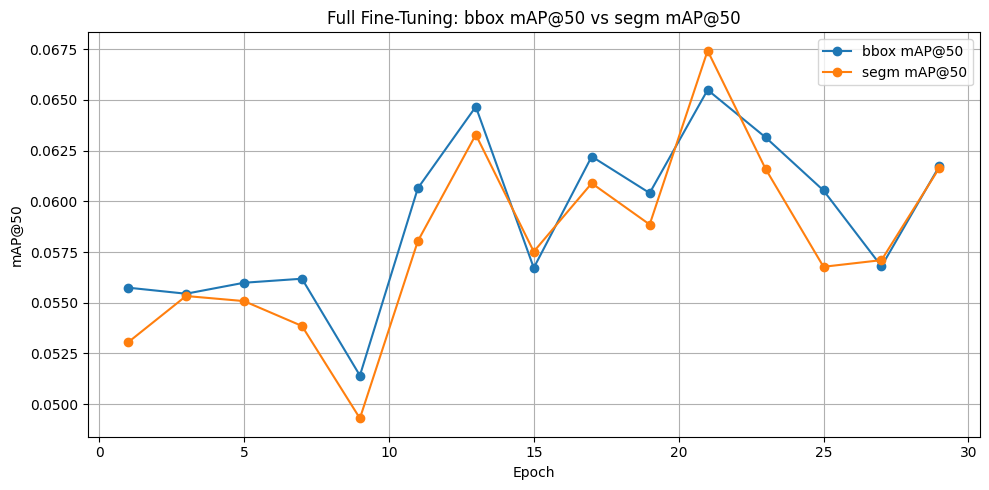

In [13]:
plt.figure(figsize=(10, 5))

plt.plot(full_eval_df["epoch"], full_eval_df["eval/bbox_map_50"], marker="o", label="bbox mAP@50")
plt.plot(full_eval_df["epoch"], full_eval_df["eval/segm_map_50"], marker="o", label="segm mAP@50")

plt.title("Full Fine-Tuning: bbox mAP@50 vs segm mAP@50")
plt.xlabel("Epoch")
plt.ylabel("mAP@50")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

Observation: `bbox_map_50` and `segm_map_50` follow similar dynamics. This suggests that mask quality is strongly tied to detection quality: if the model fails to detect or rank objects correctly, segmentation AP also remains low.

##### Best Score Over Time

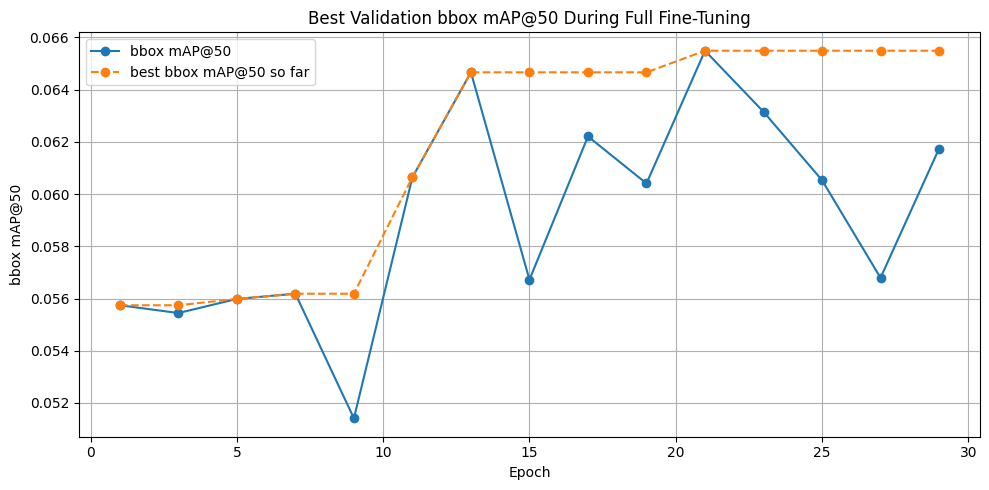

In [14]:
full_eval_df["best_bbox_map_50_so_far"] = full_eval_df["eval/bbox_map_50"].cummax()

plt.figure(figsize=(10, 5))

plt.plot(full_eval_df["epoch"], full_eval_df["eval/bbox_map_50"], marker="o", label="bbox mAP@50")
plt.plot(
    full_eval_df["epoch"],
    full_eval_df["best_bbox_map_50_so_far"],
    marker="o",
    linestyle="--",
    label="best bbox mAP@50 so far",
)

plt.title("Best Validation bbox mAP@50 During Full Fine-Tuning")
plt.xlabel("Epoch")
plt.ylabel("bbox mAP@50")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

Observation: The best validation score is reached around epoch 21. After that, the metric decreases and does not recover by the end of the run. This indicates that longer full fine-tuning alone is unlikely to solve the problem.

##### Compare Head vs Full

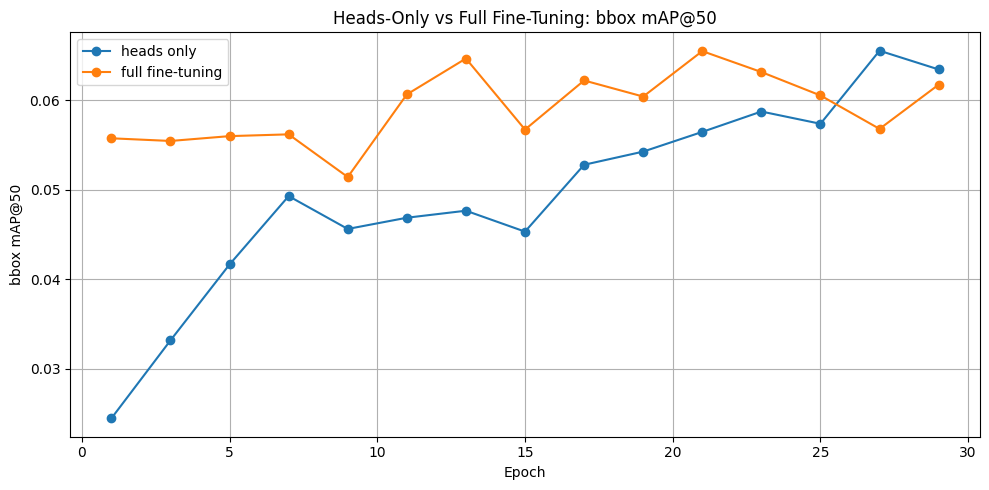

In [17]:
head_eval_df = pd.read_csv(os.path.join(DATAFRAME_PATH, "head_30_test_scheduler_max_eval.csv"))

plt.figure(figsize=(10, 5))

plt.plot(
    head_eval_df["epoch"],
    head_eval_df["eval/bbox_map_50"],
    marker="o",
    label="heads only",
)

plt.plot(
    full_eval_df["epoch"],
    full_eval_df["eval/bbox_map_50"],
    marker="o",
    label="full fine-tuning",
)

plt.title("Heads-Only vs Full Fine-Tuning: bbox mAP@50")
plt.xlabel("Epoch")
plt.ylabel("bbox mAP@50")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

Observation: Full fine-tuning does not provide a clear improvement over head-only training for the main metric. Both runs reach approximately the same best `bbox_map_50`. This suggests that the main bottleneck is not simply the number of trainable parameters.

## Conclusion

Full fine-tuning was expected to improve the baseline because it updates the whole model instead of only the detection heads. However, the results show only limited improvement.

The best `bbox_map_50` is approximately 0.0655, which is almost the same as the head-only baseline. Some secondary metrics, such as `bbox_map`, `segm_map_50`, Dice, and mask mIoU, improve slightly, but the main evaluation metric remains low.

This suggests that model capacity or trainable parameter count is not the only limiting factor. The dataset itself is challenging: many objects are small, classes are imbalanced, and several categories are visually ambiguous. Therefore, the next analysis should focus on dataset properties, class granularity, object size, and class confusion rather than only longer training.